In [1]:
import os
import random
import warnings

import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from tqdm import tqdm
from IPython.display import display, Markdown

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torchvision import models, transforms
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from torchvision.models import vgg13, VGG13_Weights, vgg16, VGG16_Weights

from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed_all(42)

# Check if GPU is available

if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"✅ Using device: {device}")

✅ Using device: mps


In [2]:
# Define paths
data_path = "Caltech20"  # Update this path to your Caltech20 dataset

# Define transformations
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Custom dataset splitter
class Caltech20DatasetSplitter:
    def __init__(self, root_dir, train_ratio=0.8):
        self.root_dir = root_dir
        self.train_ratio = train_ratio
        self.categories = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        self.train_files = []
        self.test_files = []
        self.split_dataset()
        
    def split_dataset(self):
        for category in self.categories:
            category_path = os.path.join(self.root_dir, category)
            files = sorted([os.path.join(category_path, f) for f in os.listdir(category_path) 
                          if os.path.isfile(os.path.join(category_path, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg'))])
            
            # Shuffle files
            random.shuffle(files)
            
            # Split into train and test
            split_idx = int(len(files) * self.train_ratio)
            self.train_files.extend([(f, self.categories.index(category)) for f in files[:split_idx]])
            self.test_files.extend([(f, self.categories.index(category)) for f in files[split_idx:]])
    
    def get_splits(self):
        return self.train_files, self.test_files
    
    def get_categories(self):
        return self.categories

# Custom dataset for feature extraction and original images
class Caltech20Dataset(Dataset):
    def __init__(self, file_list, transform=None, return_path=False):
        self.file_list = file_list
        self.transform = transform
        self.return_path = return_path
        
    def __len__(self):
        return len(self.file_list)
    
    def __getitem__(self, idx):
        img_path, label = self.file_list[idx]
        image = Image.open(img_path).convert('RGB')
        
        # Resize original image to ensure consistent dimensions for SIFT
        resized_image = image.resize((224, 224))
        original_image = np.array(resized_image)
        
        if self.transform:
            image = self.transform(image)
            
        if self.return_path:
            return image, original_image, label, img_path
        else:
            return image, original_image, label

# Split dataset
dataset_splitter = Caltech20DatasetSplitter(data_path)
train_files, test_files = dataset_splitter.get_splits()
categories = dataset_splitter.get_categories()

# Create datasets
train_dataset = Caltech20Dataset(train_files, transform=train_transform)
test_dataset = Caltech20Dataset(test_files, transform=test_transform, return_path=True)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0)

print(f"Loaded {len(train_dataset)} training images and {len(test_dataset)} test images")
print(f"Categories: {categories}")

Loaded 831 training images and 220 test images
Categories: ['ant', 'beaver', 'brontosaurus', 'cannon', 'chair', 'crab', 'cup', 'dragonfly', 'euphonium', 'ferry', 'gerenuk', 'headphone', 'inline_skate', 'lamp', 'lobster', 'menorah', 'nautilus', 'panda', 'pyramid', 'saxophone']


In [3]:
class BoWFeatureExtractor:
    def __init__(self, n_clusters=256, pca_components=64):
        self.n_clusters = n_clusters
        self.pca_components = pca_components
        self.pca = PCA(n_components=pca_components)
        self.kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        self.knn = NearestNeighbors(n_neighbors=1, algorithm='ball_tree')
        
    def extract_dense_sift(self, img, step_size=10):
        # Ensure img is a proper array with uint8 data type
        if not isinstance(img, np.ndarray) or img.dtype != np.uint8:
            img = np.array(img, dtype=np.uint8)
            
        # Convert to grayscale if needed
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            gray = img
            
        sift = cv2.SIFT_create()
        keypoints = [cv2.KeyPoint(x, y, step_size) for y in range(0, gray.shape[0], step_size) 
                                                    for x in range(0, gray.shape[1], step_size)]
        _, descriptors = sift.compute(gray, keypoints)
        
        if descriptors is None:
            return np.zeros((1, 128), dtype=np.float32)
        
        return descriptors
    
    def fit(self, images):
        print("Extracting SIFT features...")
        all_descriptors = []
        for img in tqdm(images):
            descriptors = self.extract_dense_sift(img)
            if descriptors is not None:
                all_descriptors.append(descriptors)
        
        all_descriptors = np.vstack(all_descriptors)
        
        print(f"Applying PCA to reduce SIFT dimensions from 128 to {self.pca_components}...")
        reduced_descriptors = self.pca.fit_transform(all_descriptors)
        
        print(f"Training K-means with {self.n_clusters} clusters...")
        self.kmeans.fit(reduced_descriptors)
        
        # Setup KNN for fast encoding
        self.knn.fit(self.kmeans.cluster_centers_)
        
        return self
    
    def encode_image(self, img):
        descriptors = self.extract_dense_sift(img)
        if descriptors is None or len(descriptors) == 0:
            return np.zeros(self.n_clusters)
        
        # Apply PCA
        reduced_descriptors = self.pca.transform(descriptors)
        
        # Assign to visual words using nearest neighbor
        indices = self.knn.kneighbors(reduced_descriptors, return_distance=False)
        
        # Create histogram of visual words
        histogram = np.zeros(self.n_clusters)
        for index in indices:
            histogram[index[0]] += 1
            
        # Normalize
        if np.sum(histogram) > 0:
            histogram = histogram / np.sum(histogram)
            
        return histogram
    
    def transform(self, images):
        print("Encoding images with BoW...")
        features = []
        for img in tqdm(images):
            feature = self.encode_image(img)
            features.append(feature)
        return np.array(features)

In [4]:
class SpatialPyramidFeatureExtractor:
    def __init__(self, bow_extractor, levels=3):
        self.bow_extractor = bow_extractor
        self.levels = levels
        
    def extract_features(self, img):
        features = []
        height, width = img.shape[:2]
        
        weights = [0.25, 0.25, 0.5]  # Weights for each level
        
        # Level 0 (whole image)
        features.append(self.bow_extractor.encode_image(img) * weights[0])
        
        if self.levels >= 2:
            # Level 1 (2x2 grid)
            h_half = height // 2
            w_half = width // 2
            
            regions = [
                img[0:h_half, 0:w_half],          # top-left
                img[0:h_half, w_half:width],      # top-right
                img[h_half:height, 0:w_half],     # bottom-left
                img[h_half:height, w_half:width]  # bottom-right
            ]
            
            for region in regions:
                features.append(self.bow_extractor.encode_image(region) * weights[1] / 4)
        
        if self.levels >= 3:
            # Level 2 (4x4 grid)
            h_quarter = height // 4
            w_quarter = width // 4
            
            for i in range(4):
                for j in range(4):
                    region = img[i*h_quarter:(i+1)*h_quarter, 
                                 j*w_quarter:(j+1)*w_quarter]
                    features.append(self.bow_extractor.encode_image(region) * weights[2] / 16)
        
        # Concatenate all features
        return np.concatenate(features)
    
    def transform(self, images):
        print("Extracting Spatial Pyramid features...")
        features = []
        for img in tqdm(images):
            feature = self.extract_features(img)
            features.append(feature)
        return np.array(features)

In [5]:
class VGGFeatureExtractor:
    def __init__(self, model_name='vgg13'):
        if model_name == 'vgg13':
            self.model = models.vgg13(weights=models.VGG13_Weights.DEFAULT)
        elif model_name == 'vgg19':
            self.model = models.vgg19(weights=models.VGG19_Weights.DEFAULT)
        else:
            raise ValueError(f"Unsupported model: {model_name}")
            
        # Remove fully connected layers
        self.model = nn.Sequential(*list(self.model.children())[:-2])
        self.model = self.model.to(device)
        self.model.eval()
        
        # Define pooling to get a fixed size feature
        self.pool = nn.AdaptiveAvgPool2d((1, 1))
        
    def transform(self, images):
        features = []
        with torch.no_grad():
            for img in images:
                img = img.unsqueeze(0).to(device)  # Add batch dimension
                feat = self.model(img)
                # Global average pooling
                feat = self.pool(feat).squeeze()
                features.append(feat.cpu().numpy())
        return np.array(features)

In [6]:
def extract_original_images():
    train_images = []
    train_labels = []
    test_images = []
    test_labels = []
    
    # Extract from training set one by one
    print("Processing training set...")
    for i in tqdm(range(len(train_dataset)), desc="Processing training set"):
        _, original, label = train_dataset[i]
        train_images.append(original)
        train_labels.append(label)
    
    # Extract from test set one by one
    print("Processing test set...")
    for i in tqdm(range(len(test_dataset)), desc="Processing test set"):
        _, original, label, _ = test_dataset[i]
        test_images.append(original)
        test_labels.append(label)
    
    # Return lists instead of arrays with dtype=object
    return train_images, np.array(train_labels), test_images, np.array(test_labels)

# Extract images from loaders
train_images, train_labels, test_images, test_labels = extract_original_images()

print(f"Extracted {len(train_images)} training images and {len(test_images)} test images")

# Extract BoW features
bow_extractor = BoWFeatureExtractor(n_clusters=256, pca_components=64)
bow_extractor.fit(train_images)

bow_train_features = bow_extractor.transform(train_images)
bow_test_features = bow_extractor.transform(test_images)

# Extract Spatial Pyramid features
spatial_pyramid_extractor = SpatialPyramidFeatureExtractor(bow_extractor, levels=3)
sp_train_features = spatial_pyramid_extractor.transform(train_images)
sp_test_features = spatial_pyramid_extractor.transform(test_images)

def extract_vgg_features(model_name):
    # Extract processed images for VGG
    train_processed_images = []
    train_labels_vgg = []
    test_processed_images = []
    test_labels_vgg = []
    
    print(f"Extracting processed images for {model_name}")
    
    # Extract from training set
    for batch in tqdm(train_loader, desc="Processing training set"):
        images, _, labels = batch
        train_processed_images.extend(images)
        train_labels_vgg.extend(labels.numpy())
    
    # Extract from test set
    for batch in tqdm(test_loader, desc="Processing test set"):
        images, _, labels, _ = batch
        test_processed_images.extend(images)
        test_labels_vgg.extend(labels.numpy())
    
    # Extract features
    print(f"Extracting {model_name} features")
    vgg_extractor = VGGFeatureExtractor(model_name=model_name)
    
    print("Processing training features...")
    train_features = vgg_extractor.transform(train_processed_images)
    print("Processing test features...")
    test_features = vgg_extractor.transform(test_processed_images)
    
    return train_features, np.array(train_labels_vgg), test_features, np.array(test_labels_vgg)
# Extract VGG13 features
vgg13_train_features, vgg13_train_labels, vgg13_test_features, vgg13_test_labels = extract_vgg_features('vgg13')

# Extract VGG19 features
vgg19_train_features, vgg19_train_labels, vgg19_test_features, vgg19_test_labels = extract_vgg_features('vgg19')

# Print feature dimensions
print(f"BoW features: {bow_train_features.shape}, {bow_test_features.shape}")
print(f"Spatial Pyramid features: {sp_train_features.shape}, {sp_test_features.shape}")
print(f"VGG13 features: {vgg13_train_features.shape}, {vgg13_test_features.shape}")
print(f"VGG19 features: {vgg19_train_features.shape}, {vgg19_test_features.shape}")

Processing training set...


Processing training set: 100%|██████████| 831/831 [00:01<00:00, 466.11it/s]


Processing test set...


Processing test set: 100%|██████████| 220/220 [00:00<00:00, 497.16it/s]


Extracted 831 training images and 220 test images
Extracting SIFT features...


100%|██████████| 831/831 [00:04<00:00, 183.44it/s]


Applying PCA to reduce SIFT dimensions from 128 to 64...
Training K-means with 256 clusters...
Encoding images with BoW...


100%|██████████| 831/831 [00:26<00:00, 30.85it/s]


Encoding images with BoW...


100%|██████████| 220/220 [00:05<00:00, 39.68it/s]


Extracting Spatial Pyramid features...


100%|██████████| 831/831 [02:38<00:00,  5.25it/s]


Extracting Spatial Pyramid features...


100%|██████████| 220/220 [00:56<00:00,  3.93it/s]


Extracting processed images for vgg13


Processing test set: 100%|██████████| 7/7 [00:00<00:00,  7.01it/s]


Extracting vgg13 features
Processing training features...
Processing test features...
Extracting processed images for vgg19


Processing test set: 100%|██████████| 7/7 [00:00<00:00, 12.92it/s]


Extracting vgg19 features
Processing training features...
Processing test features...
BoW features: (831, 256), (220, 256)
Spatial Pyramid features: (831, 5376), (220, 5376)
VGG13 features: (831, 512), (220, 512)
VGG19 features: (831, 512), (220, 512)


# BoW feature extraction visualization

Visualizing SIFT keypoints on sample images


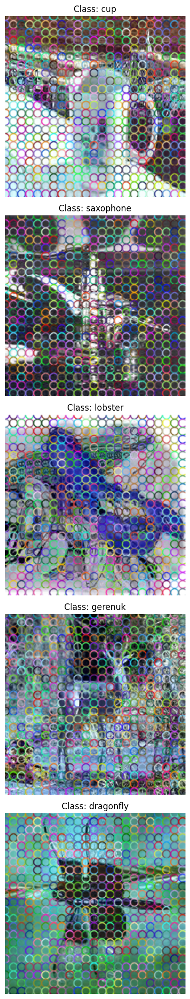

In [7]:
def visualize_keypoints():
    print("Visualizing SIFT keypoints on sample images")
    # Select a few random images from different classes
    np.random.seed(42)
    sample_indices = []
    for i in range(5):  # Get 5 random classes
        class_idx = np.random.randint(0, len(categories))
        # Find indices of this class in test set
        class_samples = np.where(test_labels == class_idx)[0]
        if len(class_samples) > 0:
            sample_indices.append(class_samples[0])  # Take the first one
    
    fig, axes = plt.subplots(len(sample_indices), 1, figsize=(10, 4*len(sample_indices)))
    if len(sample_indices) == 1:
        axes = [axes]
        
    for i, idx in enumerate(sample_indices):
        img = test_images[idx]
        # Convert to grayscale for keypoint detection
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            gray = img
            
        # Detect SIFT keypoints
        sift = cv2.SIFT_create()
        keypoints = []
        step_size = 10
        for y in range(0, gray.shape[0], step_size):
            for x in range(0, gray.shape[1], step_size):
                keypoints.append(cv2.KeyPoint(x, y, step_size))
        
        # Draw keypoints on image
        img_with_kp = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        
        axes[i].imshow(cv2.cvtColor(img_with_kp, cv2.COLOR_BGR2RGB))
        axes[i].set_title(f"Class: {categories[test_labels[idx]]}")
        axes[i].axis('off')
        
    plt.tight_layout()
    plt.savefig('keypoints_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()



# Run all visualizations
visualize_keypoints()

Visualizing visual word space with representative images


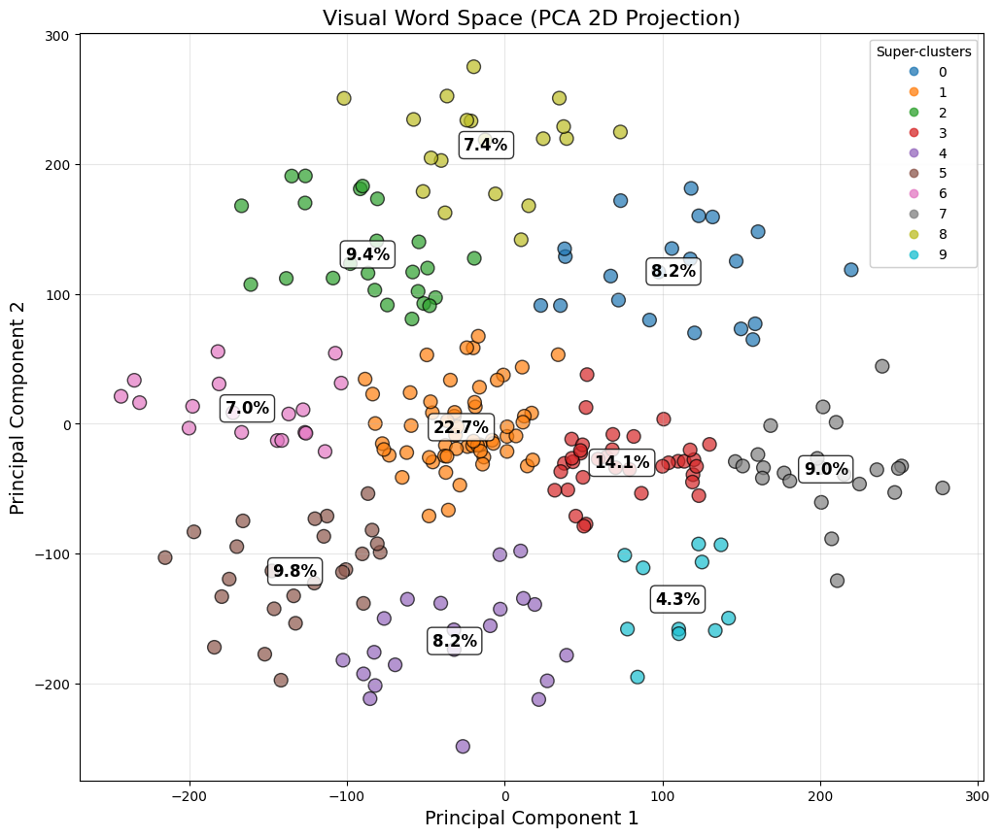

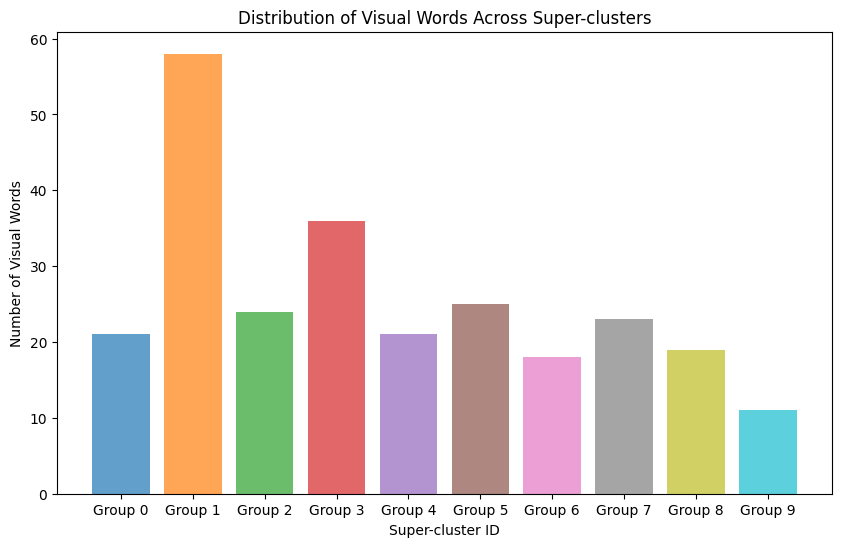

Finding representative images for each super-cluster...


100%|██████████| 100/100 [00:02<00:00, 45.13it/s]


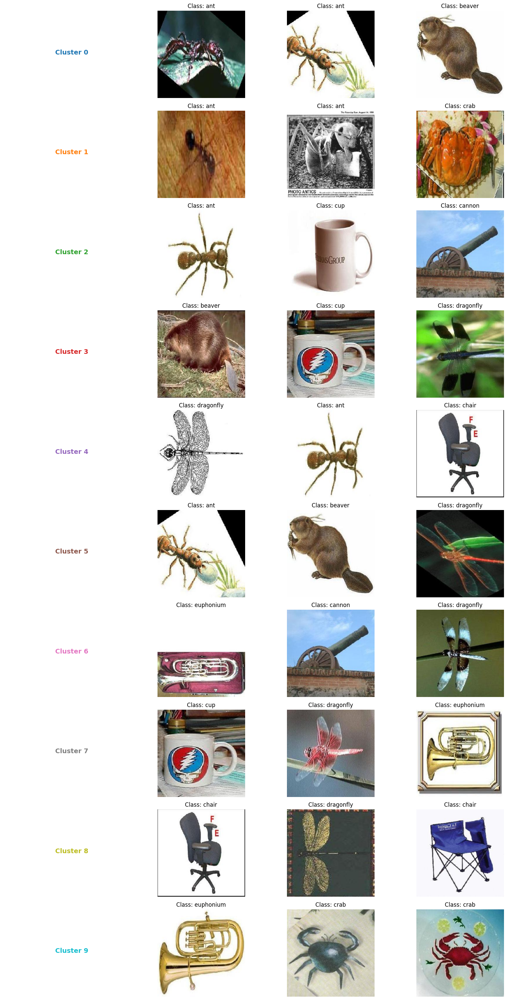

In [8]:
def visualize_visual_word_space_with_images():
    print("Visualizing visual word space with representative images")
    # Get cluster centers from the BoW extractor
    cluster_centers = bow_extractor.kmeans.cluster_centers_
    
    # Apply PCA to reduce to 2D for visualization
    pca = PCA(n_components=2)
    reduced_centers = pca.fit_transform(cluster_centers)
    
    # Create super-clusters for better visualization (using KMeans again)
    n_super_clusters = 10  # More easily distinguishable number of colors
    super_kmeans = KMeans(n_clusters=n_super_clusters, random_state=42)
    super_cluster_labels = super_kmeans.fit_predict(reduced_centers)
    
    # Plot the visual words in 2D space
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Use a qualitative colormap for discrete categories
    cmap = plt.cm.get_cmap('tab10', n_super_clusters)
    
    # Create a scatter plot with colors mapped to super-cluster labels
    scatter = ax.scatter(
        reduced_centers[:, 0], 
        reduced_centers[:, 1], 
        c=super_cluster_labels, 
        cmap=cmap,
        alpha=0.7, 
        s=100,  # Slightly larger points
        edgecolors='black'  # Add black edge for better visibility
    )
    
    # Add title and labels
    ax.set_title('Visual Word Space (PCA 2D Projection)', fontsize=16)
    ax.set_xlabel('Principal Component 1', fontsize=14)
    ax.set_ylabel('Principal Component 2', fontsize=14)
    ax.grid(True, alpha=0.3)
    
    # Add a legend with super-cluster IDs
    legend1 = ax.legend(*scatter.legend_elements(),
                        loc="upper right", title="Super-clusters")
    ax.add_artist(legend1)
    
    # Add cluster density information
    for i in range(n_super_clusters):
        # Count clusters in each super-cluster
        count = np.sum(super_cluster_labels == i)
        percentage = count / len(super_cluster_labels) * 100
        
        # Find the centroid of each super-cluster
        mask = super_cluster_labels == i
        if np.any(mask):
            centroid_x = np.mean(reduced_centers[mask, 0])
            centroid_y = np.mean(reduced_centers[mask, 1])
            
            # Annotate with the percentage of clusters
            ax.annotate(f"{percentage:.1f}%", 
                        (centroid_x, centroid_y),
                        fontsize=12,
                        weight='bold',
                        ha='center',
                        va='center',
                        bbox=dict(boxstyle="round,pad=0.3", 
                                  fc="white", 
                                  ec="black", 
                                  alpha=0.8))
    
    plt.savefig('visual_word_space_clustered.png', dpi=300, bbox_inches='tight')
    plt.show()
    

    fig, ax = plt.subplots(figsize=(10, 6))
    for i in range(n_super_clusters):
        count = np.sum(super_cluster_labels == i)
        ax.bar(f"Group {i}", count, alpha=0.7, color=cmap(i))
    
    ax.set_title("Distribution of Visual Words Across Super-clusters")
    ax.set_xlabel("Super-cluster ID")
    ax.set_ylabel("Number of Visual Words")
    plt.savefig('visual_word_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Find representative images for each super-cluster
    print("Finding representative images for each super-cluster...")
    
    # Create mapping from visual words to super-clusters
    word_to_supercluster = {}
    for i, label in enumerate(super_cluster_labels):
        word_to_supercluster[i] = label
    
    # Find images that have the highest activation for each super-cluster
    supercluster_scores = {i: [] for i in range(n_super_clusters)}
    
    # Compute scores for each image based on its visual word histogram
    for idx, img in enumerate(tqdm(test_images[:100])):  # Limit to first 100 images for speed
        histogram = bow_extractor.encode_image(img)
        
        # Calculate score for each super-cluster
        for super_idx in range(n_super_clusters):
            # Find visual words belonging to this super-cluster
            words_in_super = [i for i, sc in word_to_supercluster.items() if sc == super_idx]
            
            # Calculate score based on total activation of those words
            score = sum(histogram[i] for i in words_in_super)
            supercluster_scores[super_idx].append((idx, score))
    
    # For each super-cluster, find top 3 images with highest scores
    top_images_per_supercluster = {}
    for super_idx in range(n_super_clusters):
        # Sort by score descending
        top_indices = sorted(supercluster_scores[super_idx], key=lambda x: x[1], reverse=True)[:3]
        top_images_per_supercluster[super_idx] = [idx for idx, _ in top_indices]
    
    rows = n_super_clusters
    fig, axes = plt.subplots(rows, 4, figsize=(16, rows * 3))  # 4 columns per row (1 for title, 3 for images)
    
    for super_idx in range(n_super_clusters):
        row_idx = super_idx
        
        # Add super-cluster title
        axes[row_idx, 0].text(0.5, 0.5, f"Cluster {super_idx}", 
                            fontsize=14, 
                            ha='center',
                            color=cmap(super_idx),
                            weight='bold')
        axes[row_idx, 0].axis('off')
        
        # Add representative images
        for j, img_idx in enumerate(top_images_per_supercluster[super_idx]):
            col = j + 1  # Start from column 1 (column 0 is for title)
            try:
                axes[row_idx, col].imshow(test_images[img_idx])
                axes[row_idx, col].set_title(f"Class: {categories[test_labels[img_idx]]}")
                axes[row_idx, col].axis('off')
            except IndexError:
                print(f"Warning: Could not display image for cluster {super_idx}, image {j+1}")
    
    plt.tight_layout()
    plt.savefig('representative_images_per_cluster.png', dpi=300, bbox_inches='tight')
    plt.show()
    
visualize_visual_word_space_with_images()

Visualizing BoW in image → visual words → histogram style


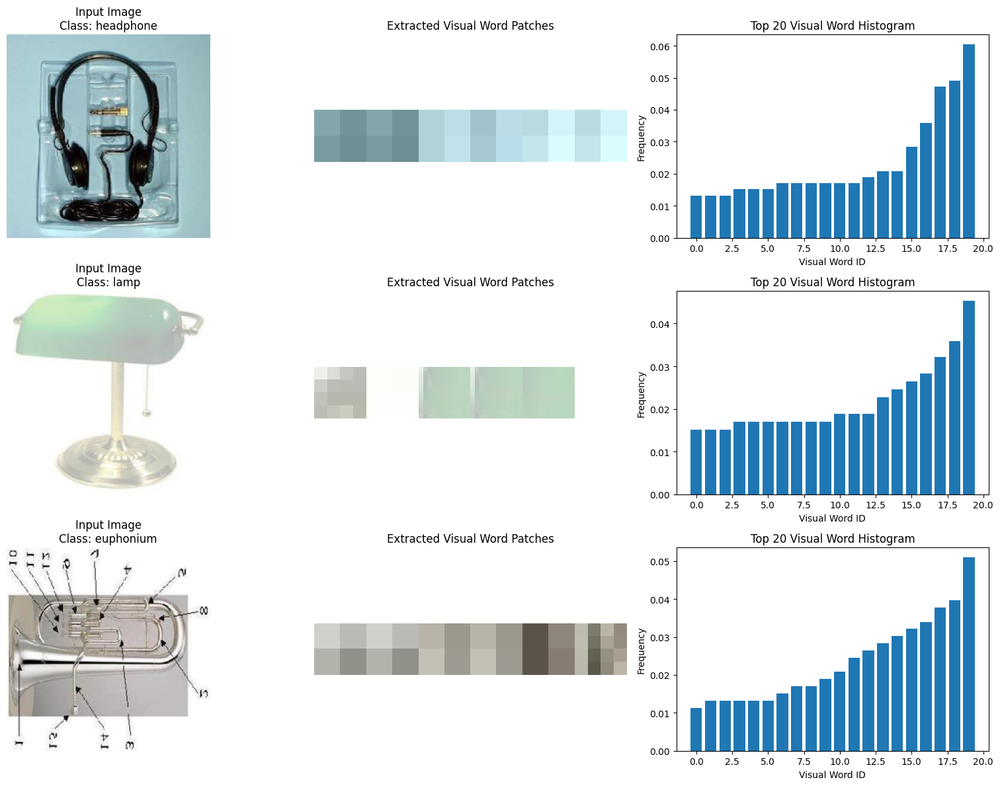

In [9]:
def visualize_histograms_bow_style(num_samples=3, num_patches=6):
    print("Visualizing BoW in image → visual words → histogram style")

    # Fix seed for reproducibility
    np.random.seed(42)
    
    # Random sample from test set
    indices = np.random.choice(len(test_images), size=num_samples, replace=False)
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(16, 4 * num_samples))
    
    for row_idx, img_idx in enumerate(indices):
        img = test_images[img_idx]
        label = test_labels[img_idx]
        
        # --- Original Image ---
        axes[row_idx, 0].imshow(img)
        axes[row_idx, 0].set_title(f"Input Image\nClass: {categories[label]}")
        axes[row_idx, 0].axis('off')
        
        # --- SIFT Keypoints ---
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sift = cv2.SIFT_create()
        keypoints, _ = sift.detectAndCompute(gray, None)
        
        patch_imgs = []
        for kp in keypoints[:num_patches]:
            x, y = int(kp.pt[0]), int(kp.pt[1])
            size = int(kp.size // 2)
            patch = img[max(0, y-size):y+size, max(0, x-size):x+size]
            if patch.size > 0:
                patch_imgs.append(patch)
        
        axes[row_idx, 1].axis('off')
        axes[row_idx, 1].set_title("Extracted Visual Word Patches")
        for i, patch in enumerate(patch_imgs[:num_patches]):
            ax_patch = axes[row_idx, 1].inset_axes([i/num_patches, 0, 1/num_patches, 1])
            ax_patch.imshow(patch)
            ax_patch.axis('off')
        
        # --- Histogram ---
        histogram = bow_extractor.encode_image(img)
        non_zero = histogram > 0
        if np.sum(non_zero) > 20:
            # 상위 20개
            top_ids = np.argsort(histogram)[-20:]
            top_vals = histogram[top_ids]
            axes[row_idx, 2].bar(range(len(top_ids)), top_vals)
            axes[row_idx, 2].set_title("Top 20 Visual Word Histogram")
        else:
            axes[row_idx, 2].bar(np.where(non_zero)[0], histogram[non_zero])
            axes[row_idx, 2].set_title("BoW Histogram (Non-zero bins)")
        
        axes[row_idx, 2].set_xlabel("Visual Word ID")
        axes[row_idx, 2].set_ylabel("Frequency")

    plt.tight_layout()
    plt.savefig("bow_pipeline_visualization.png", dpi=300)
    plt.show()
    
visualize_histograms_bow_style(num_samples=3, num_patches=6)

# Spatial Pyramid Visualization

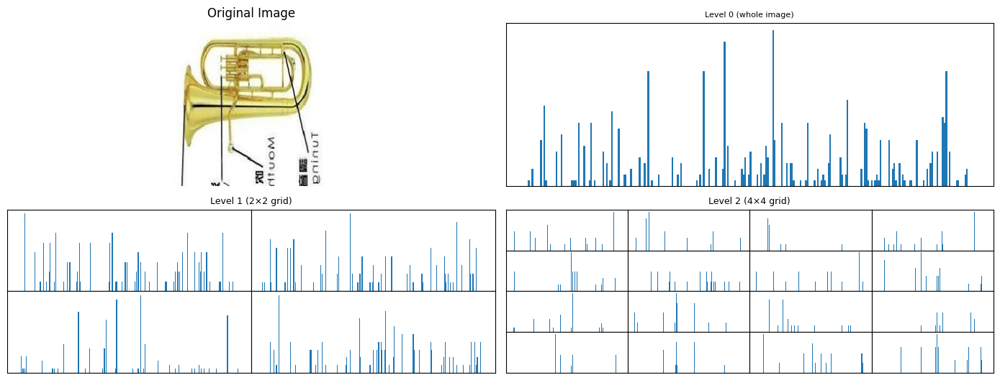

In [10]:
def visualize_spatial_pyramid_histograms():

    # Randomly select an image from the test set
    np.random.seed(42)
    img_idx = np.random.randint(len(test_images))
    img = test_images[img_idx]
    label = test_labels[img_idx]

    # Get the dimensions of the image
    h, w = img.shape[:2]
    bow = bow_extractor

    def draw_hist(ax, desc, title=None):
        ax.bar(np.arange(len(desc)), desc, width=1.0)
        if title:
            ax.set_title(title, fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])

    fig = plt.figure(figsize=(14, 8))
    gs = gridspec.GridSpec(3, 2)

    # 1. Original image
    ax_img = fig.add_subplot(gs[0, 0])
    ax_img.imshow(img)
    ax_img.set_title("Original Image")
    ax_img.axis('off')

    # 2. Level 0 (whole image)
    hist0 = bow.encode_image(img)
    ax_l0 = fig.add_subplot(gs[0, 1])
    draw_hist(ax_l0, hist0, "Level 0 (whole image)")

    # 3. Level 1 (2x2 grid)
    h_half, w_half = h // 2, w // 2
    ax_l1 = fig.add_subplot(gs[1, 0])
    ax_l1.set_title("Level 1 (2×2 grid)", fontsize=9)
    ax_l1.axis('off')
    for i in range(2):
        for j in range(2):
            region = img[i*h_half:(i+1)*h_half, j*w_half:(j+1)*w_half]
            hist = bow.encode_image(region)
            inset = ax_l1.inset_axes([j*0.5, 1 - (i+1)*0.5, 0.5, 0.5])
            draw_hist(inset, hist)

    # 4. Level 2 (4x4 grid)
    h_q, w_q = h // 4, w // 4
    ax_l2 = fig.add_subplot(gs[1, 1])
    ax_l2.set_title("Level 2 (4×4 grid)", fontsize=9)
    ax_l2.axis('off')
    for i in range(4):
        for j in range(4):
            region = img[i*h_q:(i+1)*h_q, j*w_q:(j+1)*w_q]
            hist = bow.encode_image(region)
            inset = ax_l2.inset_axes([j*0.25, 1 - (i+1)*0.25, 0.25, 0.25])
            draw_hist(inset, hist)


    plt.tight_layout()
    plt.savefig("spatial_pyramid_hierarchy.png", dpi=300, bbox_inches='tight')
    plt.show()

visualize_spatial_pyramid_histograms()

---

# VGG-13 Feature Extraction and Learning

Visualizing VGG internal activations and feature space...


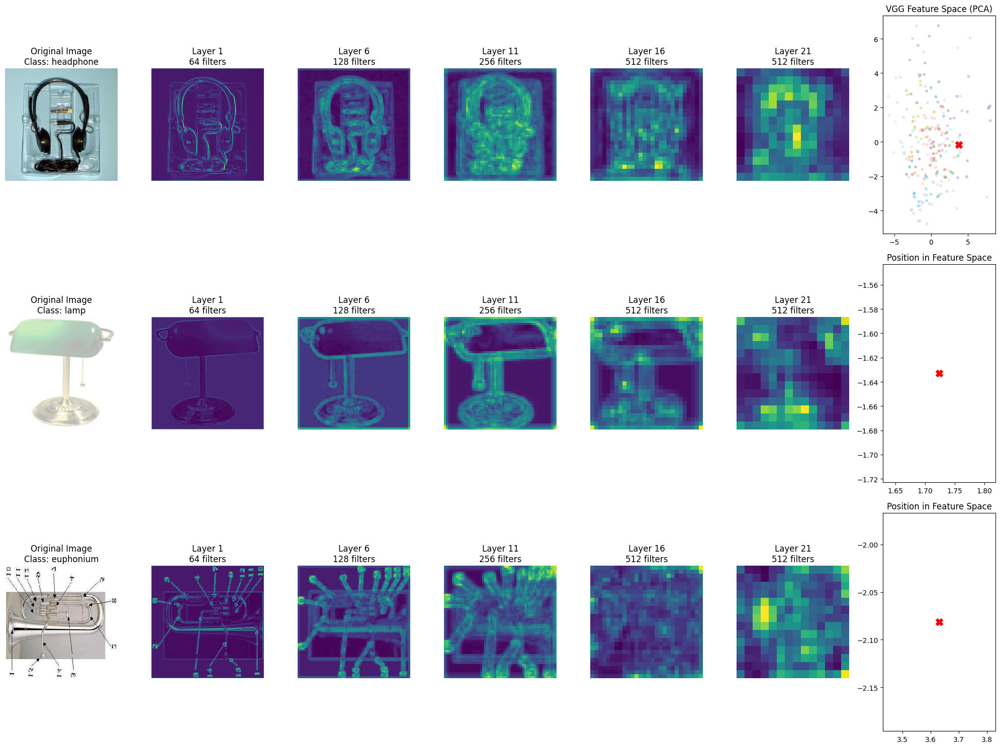

In [11]:

def visualize_vgg_network():
    # Sample Images
    np.random.seed(42)
    sample_indices = np.random.choice(len(test_images), 3, replace=False)
    
    # model initialization 
    vgg_model = models.vgg13(weights=models.VGG13_Weights.DEFAULT).to(device)
    vgg_model.eval()
    
    # VGG13 features
    print("Visualizing VGG internal activations and feature space...")
    
    # 활성화 추출을 위한 훅 설정
    activation_layers = ['1', '6', '11', '16', '21']  # Conv layers to visualize
    activations = {}
    
    def get_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook
    
    # Register hooks to the model
    hooks = []
    for name, module in vgg_model.features.named_children():
        if name in activation_layers:
            hooks.append(module.register_forward_hook(get_activation(name)))
    
    # Prepare test images
    pca = PCA(n_components=2)
    reduced_features = pca.fit_transform(vgg13_test_features)
    
    # Plotting
    fig1 = plt.figure(figsize=(20, 15))
    gs = gridspec.GridSpec(len(sample_indices), 7, figure=fig1)
    
    for i, idx in enumerate(sample_indices):
        img = test_images[idx]
        img_tensor = train_transform(Image.fromarray(img)).unsqueeze(0).to(device)
        
        with torch.no_grad():
            vgg_model(img_tensor)
        
        ax_img = fig1.add_subplot(gs[i, 0])
        ax_img.imshow(img)
        ax_img.set_title(f"Original Image\nClass: {categories[test_labels[idx]]}")
        ax_img.axis('off')
        
        for j, layer_name in enumerate(activation_layers):
            ax_act = fig1.add_subplot(gs[i, j+1])
            
            # Load Activation map
            activation = activations[layer_name].squeeze().cpu().numpy()
            
            # visualize the activation map
            act_map = np.mean(activation, axis=0)
            
            # heatmap normalization
            ax_act.imshow(act_map, cmap='viridis')
            ax_act.set_title(f"Layer {layer_name}\n{activation.shape[0]} filters")
            ax_act.axis('off')
        
        # Feature space visualization
        ax_feat = fig1.add_subplot(gs[i, 6])
        
        # scatter plot of reduced features
        if i == 0:
            ax_feat.scatter(reduced_features[:, 0], reduced_features[:, 1],
                          c=vgg13_test_labels, alpha=0.3, s=10, cmap='tab20')
        
        # highlight the sample point
        sample_point = reduced_features[idx]
        ax_feat.scatter(sample_point[0], sample_point[1], c='red', s=100, marker='X')
        
        if i == 0:
            ax_feat.set_title("VGG Feature Space (PCA)")
        else:
            ax_feat.set_title("Position in Feature Space")
    
    # Remove hooks
    for hook in hooks:
        hook.remove()
    
    plt.tight_layout()
    plt.savefig("vgg_feature_visualization.png", dpi=300, bbox_inches='tight')
    plt.show()
    
visualize_vgg_network()

In [12]:
def convert_relu_to_non_inplace(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.ReLU(inplace=False))
        else:
            convert_relu_to_non_inplace(child)

# Grad-CAM 클래스 (공통)
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_full_backward_hook(self.save_gradient)
        
    def save_activation(self, module, input, output):
        self.activations = output
        
    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]
        
    def __call__(self, x, class_idx=None):
        model_output = self.model(x)
        if class_idx is None:
            class_idx = torch.argmax(model_output, dim=1)
        one_hot = torch.zeros_like(model_output)
        one_hot[0, class_idx] = 1
        self.model.zero_grad()
        model_output.backward(gradient=one_hot, retain_graph=True)
        gradients = self.gradients.detach().cpu().numpy()[0]
        activations = self.activations.detach().cpu().numpy()[0]
        weights = np.mean(gradients, axis=(1, 2))
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]
        cam = np.maximum(cam, 0)
        cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam) + 1e-8)
        return cam

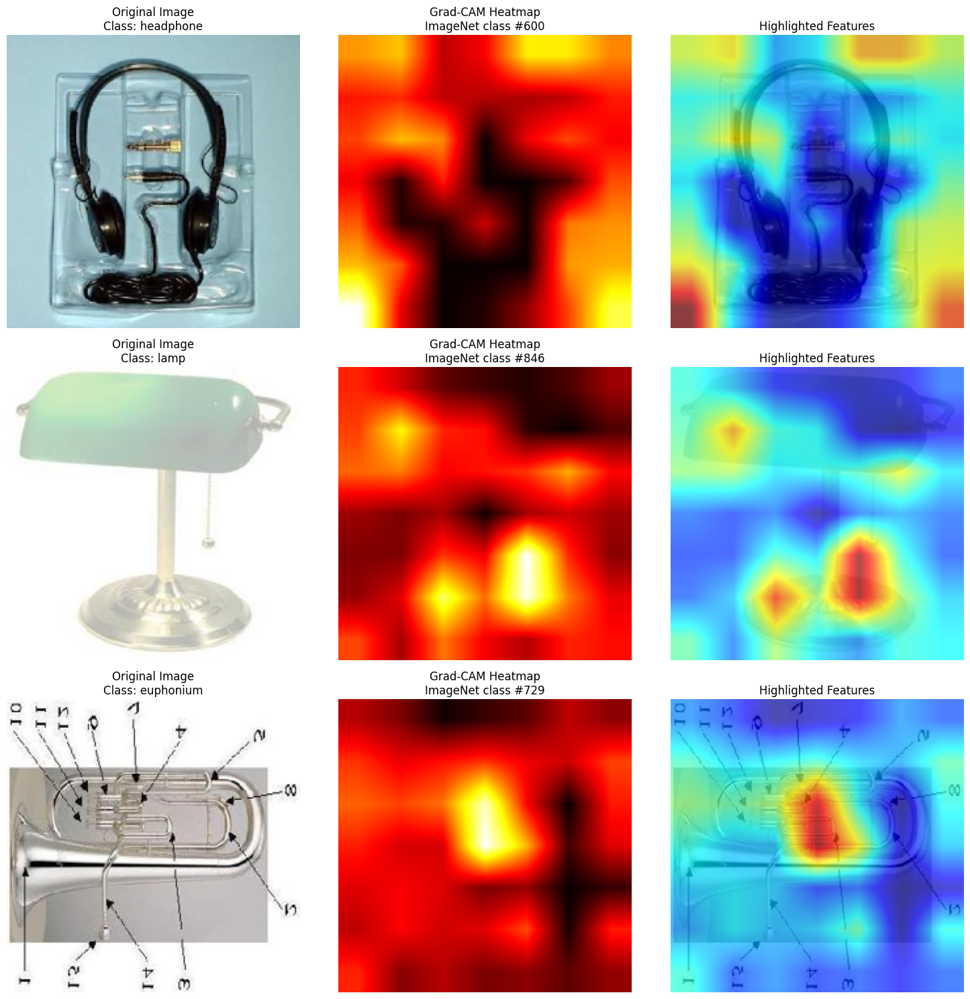

In [13]:
# Define sample indices for visualization
np.random.seed(42)
sample_indices = np.random.choice(len(test_images), 3, replace=False)

# model initialization 
vgg_model = models.vgg13(weights=models.VGG13_Weights.DEFAULT).to(device)
vgg_model.eval()
# load the last later of VGG
target_layer = vgg_model.features[-1]
grad_cam = GradCAM(vgg_model, target_layer)
#plot
fig2, axes = plt.subplots(len(sample_indices), 3, figsize=(15, 5*len(sample_indices)))

for i, idx in enumerate(sample_indices):
    img = test_images[idx]
    img_tensor = train_transform(Image.fromarray(img)).unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = vgg_model(img_tensor)
        predicted_class = torch.argmax(output, dim=1).item()
    
    caltech_class = f"Class: {categories[test_labels[idx]]}"
    predicted_class_name = f"ImageNet class #{predicted_class}"
    
    cam = grad_cam(img_tensor, predicted_class)
    
    cam_resized = cv2.resize(cam, (img.shape[1], img.shape[0]))
    
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    superimposed = np.float32(heatmap) / 255 * 0.7 + np.float32(img) / 255 * 0.3
    superimposed = (superimposed * 255).astype(np.uint8)
    
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"Original Image\n{caltech_class}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(cam_resized, cmap='hot')
    axes[i, 1].set_title(f"Grad-CAM Heatmap\n{predicted_class_name}")
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(superimposed)
    axes[i, 2].set_title("Highlighted Features")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.savefig("vgg_gradcam_visualization.png", dpi=300, bbox_inches='tight')
plt.show()

---

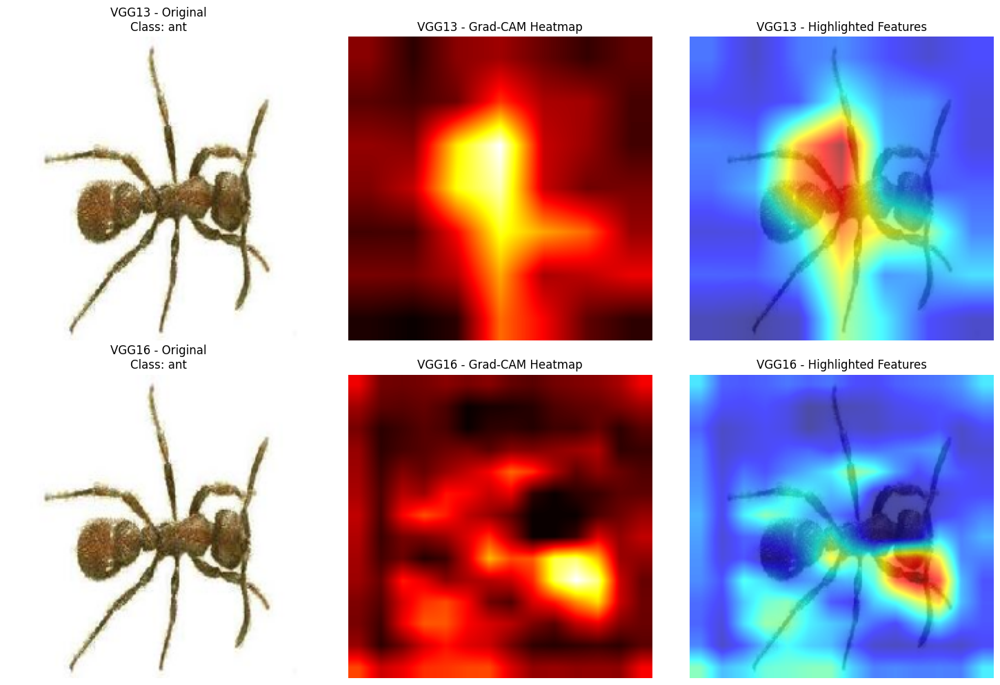

In [14]:
def compare_vgg13_vs_vgg16_on_image(image_idx):
    img = test_images[image_idx]
    img_tensor = train_transform(Image.fromarray(img)).unsqueeze(0).to(device)
    label = test_labels[image_idx]
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    for row_idx, (arch, layer_idx) in enumerate([('VGG13', -1), ('VGG16', -2)]):
    
        model = models.__dict__[arch.lower()](weights=models.__dict__[f'{arch}_Weights'].DEFAULT).to(device)
        convert_relu_to_non_inplace(model)
        model.eval()
        
    
        grad_cam = GradCAM(model, model.features[layer_idx])
        
    
        with torch.no_grad():
            output = model(img_tensor)
            predicted_class = torch.argmax(output, dim=1).item()
        cam = grad_cam(img_tensor, predicted_class)
        cam_resized = cv2.resize(cam, (img.shape[1], img.shape[0]))
        heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        superimposed = np.float32(heatmap) / 255 * 0.7 + np.float32(img) / 255 * 0.3
        superimposed = (superimposed * 255).astype(np.uint8)
        
    
        axes[row_idx, 0].imshow(img)
        axes[row_idx, 0].set_title(f"{arch} - Original\nClass: {categories[label]}")
        axes[row_idx, 0].axis('off')

        axes[row_idx, 1].imshow(cam_resized, cmap='hot')
        axes[row_idx, 1].set_title(f"{arch} - Grad-CAM Heatmap")
        axes[row_idx, 1].axis('off')

        axes[row_idx, 2].imshow(superimposed)
        axes[row_idx, 2].set_title(f"{arch} - Highlighted Features")
        axes[row_idx, 2].axis('off')
    
    plt.tight_layout()
    plt.savefig("vgg13_vs_vgg16_headphone_comparison.png", dpi=300, bbox_inches='tight')
    plt.show()

headphone_idx = 5  
compare_vgg13_vs_vgg16_on_image(headphone_idx)


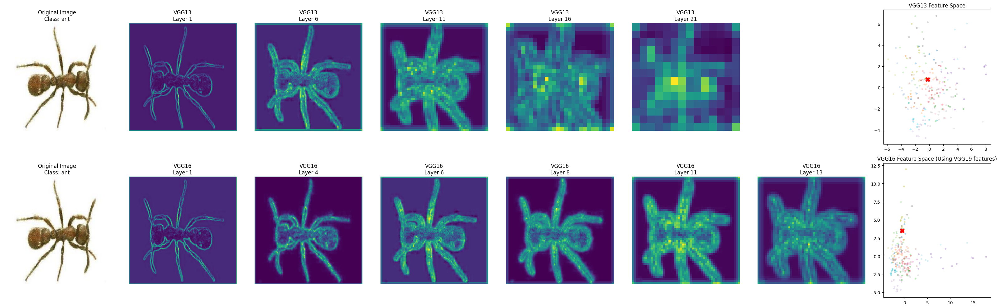

In [15]:
def visualize_vgg13_and_vgg16_vertically(img_idx):
    # Import required weight classes
    
    img = test_images[img_idx]
    img_tensor = train_transform(Image.fromarray(img)).unsqueeze(0).to(device)
    label = test_labels[img_idx]

    # model loading
    vgg13 = models.vgg13(weights=VGG13_Weights.DEFAULT).to(device)
    vgg16 = models.vgg16(weights=VGG16_Weights.DEFAULT).to(device)
    convert_relu_to_non_inplace(vgg13)
    convert_relu_to_non_inplace(vgg16)
    vgg13.eval()
    vgg16.eval()

    # Hook Layers
    layers_13 = ['1', '6', '11', '16', '21']
    layers_16 = ['1', '4', '6', '8', '11', '13']
    activations_13 = {}
    activations_16 = {}

    def get_hook(layer_dict, name):
        return lambda m, i, o: layer_dict.__setitem__(name, o.detach())

    # Hook registration
    hooks_13 = [m.register_forward_hook(get_hook(activations_13, name))
                for name, m in vgg13.features.named_children() if name in layers_13]
    hooks_16 = [m.register_forward_hook(get_hook(activations_16, name))
                for name, m in vgg16.features.named_children() if name in layers_16]

    # Forward
    with torch.no_grad():
        vgg13(img_tensor)
        vgg16(img_tensor)

    # PCA
    pca13 = PCA(n_components=2).fit_transform(vgg13_test_features)
    pca16 = PCA(n_components=2).fit_transform(vgg19_test_features)  # Using vgg19 features as proxy for vgg16

    # Figure set
    max_layers = max(len(layers_13), len(layers_16))
    total_cols = 2 + max_layers 
    fig = plt.figure(figsize=(4 * total_cols, 10))
    gs = gridspec.GridSpec(2, total_cols, figure=fig)

    # ---- VGG13 (1st row) ----
    row = 0

    # Original Image
    ax = fig.add_subplot(gs[row, 0])
    ax.imshow(img)
    ax.set_title(f"Original Image\nClass: {categories[label]}")
    ax.axis('off')

    # Activation Maps
    for i, layer_name in enumerate(layers_13):
        act = activations_13[layer_name].squeeze().cpu().numpy()
        act_map = np.mean(act, axis=0)
        ax = fig.add_subplot(gs[row, i + 1])
        ax.imshow(act_map, cmap='viridis')
        ax.set_title(f"VGG13\nLayer {layer_name}")
        ax.axis('off')

    # PCA Feature Space
    ax = fig.add_subplot(gs[row, -1])
    ax.scatter(pca13[:, 0], pca13[:, 1], c=vgg13_test_labels, alpha=0.3, s=10, cmap='tab20')
    ax.scatter(pca13[img_idx, 0], pca13[img_idx, 1], c='red', s=100, marker='X')
    ax.set_title("VGG13 Feature Space")

    # ---- VGG16 (2nd row) ----
    row = 1

    # Original Image
    ax = fig.add_subplot(gs[row, 0])
    ax.imshow(img)
    ax.set_title(f"Original Image\nClass: {categories[label]}")
    ax.axis('off')

    # Activation Maps
    for i, layer_name in enumerate(layers_16):
        act = activations_16[layer_name].squeeze().cpu().numpy()
        act_map = np.mean(act, axis=0)
        ax = fig.add_subplot(gs[row, i + 1])
        ax.imshow(act_map, cmap='viridis')
        ax.set_title(f"VGG16\nLayer {layer_name}")
        ax.axis('off')

    # PCA Feature Space - Using VGG19 features as we don't have VGG16 features extracted
    ax = fig.add_subplot(gs[row, -1])
    ax.scatter(pca16[:, 0], pca16[:, 1], c=vgg19_test_labels, alpha=0.3, s=10, cmap='tab20')
    ax.scatter(pca16[img_idx, 0], pca16[img_idx, 1], c='red', s=100, marker='X')
    ax.set_title("VGG16 Feature Space (Using VGG19 features)")

    # Clean up hooks before returning
    for hook in hooks_13:
        hook.remove()
    for hook in hooks_16:
        hook.remove()
        
    plt.tight_layout()
    plt.savefig("vgg13_vgg16_vertical_comparison.png", dpi=300, bbox_inches='tight')
    plt.show()

headphone_idx = 5
visualize_vgg13_and_vgg16_vertically(headphone_idx)

---

In [16]:
# Define a function to train and evaluate classifiers
def train_evaluate_classifier(classifier_name, train_features, train_labels, test_features, test_labels):
    if classifier_name == 'svm':
        classifier = LinearSVC(max_iter=10000, dual=False)
    elif classifier_name == 'random_forest':
        classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    elif classifier_name == 'fc':
        return train_evaluate_fc(train_features, train_labels, test_features, test_labels)
    else:
        raise ValueError(f"Unknown classifier: {classifier_name}")
    
    # Train classifier
    print(f"Training {classifier_name}...")
    classifier.fit(train_features, train_labels)
    
    # Evaluate
    predictions = classifier.predict(test_features)
    accuracy = accuracy_score(test_labels, predictions)
    conf_matrix = confusion_matrix(test_labels, predictions)
    
    return accuracy, conf_matrix, predictions

# Define the FC network classifier
class FCClassifier(nn.Module):
    def __init__(self, input_size, num_classes):
        super(FCClassifier, self).__init__()
        self.fc1 = nn.Linear(input_size, 512)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, num_classes)
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

def train_evaluate_fc(train_features, train_labels, test_features, test_labels):
    # Convert to tensors
    X_train = torch.FloatTensor(train_features)
    y_train = torch.LongTensor(train_labels)
    X_test = torch.FloatTensor(test_features)
    y_test = torch.LongTensor(test_labels)
    
    # Create dataset and dataloader
    class FeatureDataset(Dataset):
        def __init__(self, features, labels):
            self.features = features
            self.labels = labels
            
        def __len__(self):
            return len(self.features)
        
        def __getitem__(self, idx):
            return self.features[idx], self.labels[idx]
    
    train_dataset = FeatureDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    
    # Create model
    input_size = train_features.shape[1]
    num_classes = len(np.unique(train_labels))
    model = FCClassifier(input_size, num_classes)
    model.to(device)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    # Train model
    print("Training 2-layer FC network...")
    model.train()
    num_epochs = 100
    
    for epoch in range(num_epochs):
        running_loss = 0.0
        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        
        if (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader):.4f}")
    
    # Evaluate model
    model.eval()
    with torch.no_grad():
        X_test = X_test.to(device)
        outputs = model(X_test)
        _, predicted = torch.max(outputs, 1)
        predicted = predicted.cpu().numpy()
    
    accuracy = accuracy_score(test_labels, predicted)
    conf_matrix = confusion_matrix(test_labels, predicted)
    
    return accuracy, conf_matrix, predicted

# Dictionary to store results
results = {}

# Feature extractors
feature_extractors = {
    'BoW': (bow_train_features, train_labels, bow_test_features, test_labels),
    'Spatial Pyramid': (sp_train_features, train_labels, sp_test_features, test_labels),
    'VGG13': (vgg13_train_features, vgg13_train_labels, vgg13_test_features, vgg13_test_labels),
    'VGG19': (vgg19_train_features, vgg19_train_labels, vgg19_test_features, vgg19_test_labels)
}

# Classifiers
classifiers = ['svm', 'random_forest', 'fc']

# Train and evaluate all combinations
for feature_name, features in feature_extractors.items():
    train_feat, train_lab, test_feat, test_lab = features
    
    for classifier_name in classifiers:
        print(f"\nTraining {classifier_name} with {feature_name} features")
        accuracy, conf_matrix, predictions = train_evaluate_classifier(
            classifier_name, train_feat, train_lab, test_feat, test_lab)
        
        results[f"{feature_name}_{classifier_name}"] = {
            'accuracy': accuracy,
            'conf_matrix': conf_matrix,
            'predictions': predictions,
            'ground_truth': test_lab
        }
        
        print(f"Accuracy: {accuracy:.4f}")

# Print summary of results
print("\nSummary of Classification Results:")
print("-" * 50)
print(f"{'Feature + Classifier':<30} {'Accuracy':<10}")
print("-" * 50)

for key, value in results.items():
    print(f"{key:<30} {value['accuracy']:.4f}")


Training svm with BoW features
Training svm...
Accuracy: 0.4364

Training random_forest with BoW features
Training random_forest...
Accuracy: 0.5136

Training fc with BoW features
Training 2-layer FC network...
Epoch 5/100, Loss: 2.9121
Epoch 10/100, Loss: 2.7316
Epoch 15/100, Loss: 2.4633
Epoch 20/100, Loss: 2.2246
Epoch 25/100, Loss: 2.0423
Epoch 30/100, Loss: 1.8956
Epoch 35/100, Loss: 1.7870
Epoch 40/100, Loss: 1.6832
Epoch 45/100, Loss: 1.5794
Epoch 50/100, Loss: 1.4978
Epoch 55/100, Loss: 1.4175
Epoch 60/100, Loss: 1.3550
Epoch 65/100, Loss: 1.2967
Epoch 70/100, Loss: 1.2408
Epoch 75/100, Loss: 1.1468
Epoch 80/100, Loss: 1.1225
Epoch 85/100, Loss: 1.0794
Epoch 90/100, Loss: 1.0303
Epoch 95/100, Loss: 0.9834
Epoch 100/100, Loss: 0.9421
Accuracy: 0.5227

Training svm with Spatial Pyramid features
Training svm...
Accuracy: 0.3545

Training random_forest with Spatial Pyramid features
Training random_forest...
Accuracy: 0.5636

Training fc with Spatial Pyramid features
Training 2-lay

Randomly selected image - Class: nautilus
Training a classifier for visualization purposes...
Quick training epoch 1/5, Loss: 2.5625
Quick training epoch 2/5, Loss: 1.5346
Quick training epoch 3/5, Loss: 0.8350
Quick training epoch 4/5, Loss: 0.5173
Quick training epoch 5/5, Loss: 0.3762


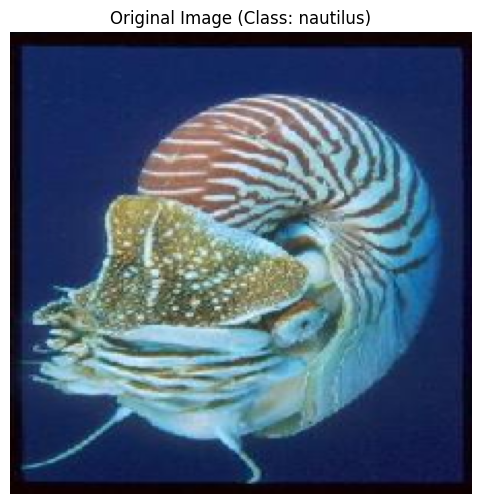

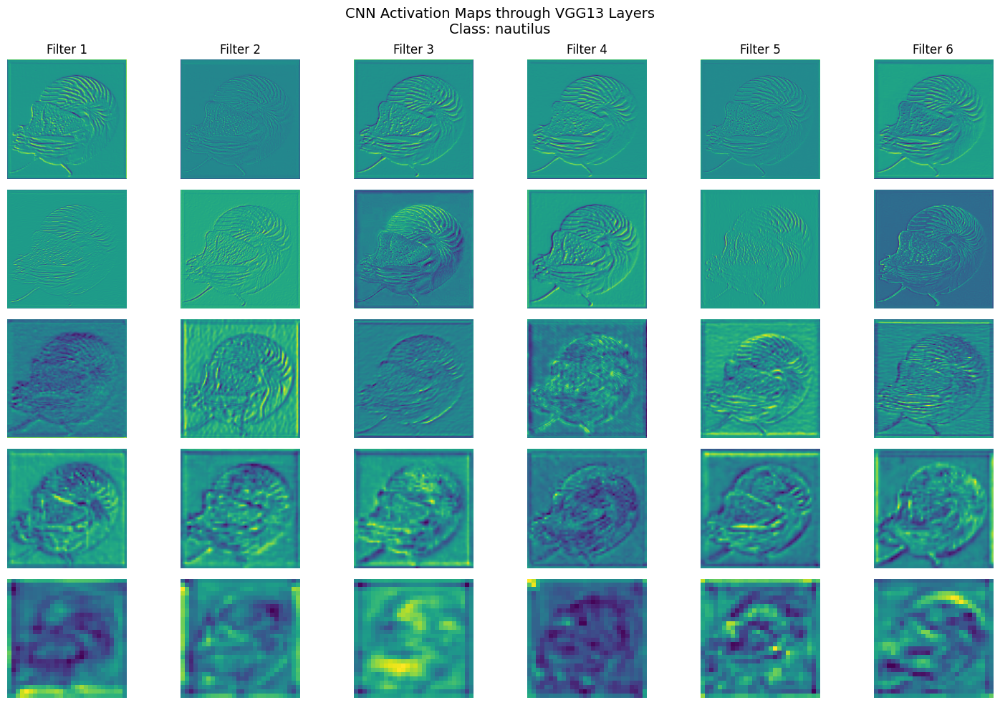

<Figure size 640x480 with 0 Axes>

In [17]:
# CNN Layer-wise Visualization (VGG13) with Fine-tuned Classifier
def visualize_finetuned_layer_progression():
    """Visualize VGG13 layer activations using our fine-tuned classifier"""
    # Select a random image
    random_idx = random.randint(0, len(test_images) - 1)
    sample_img = test_images[random_idx]
    sample_label = test_labels[random_idx]
    
    print(f"Randomly selected image - Class: {categories[sample_label]}")
    
    # Prepare image
    image = Image.fromarray(sample_img)
    transform = Compose([
        Resize((224, 224)),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Load VGG13 model for feature extraction (base model)
    weights = VGG13_Weights.DEFAULT
    base_model = vgg13(weights=weights).features.to(device).eval()
    full_vgg = vgg13(weights=weights).to(device).eval()
    
    # Create the fine-tuned classifier
    input_size = vgg13_test_features.shape[1]  # Get feature dimension
    num_classes = len(categories)
    fc_classifier = FCClassifier(input_size, num_classes).to(device)
    
    # Load classifier weights from our best VGG13 model
    # This assumes the FC classifier for VGG13 was already trained in the previous code
    # For demonstration, we'll retrain a quick model
    print("Training a classifier for visualization purposes...")
    X_train = torch.FloatTensor(vgg13_train_features)
    y_train = torch.LongTensor(vgg13_train_labels)
    
    # Create dataset and dataloader
    class FeatureDataset(Dataset):
        def __init__(self, features, labels):
            self.features = features
            self.labels = labels
            
        def __len__(self):
            return len(self.features)
        
        def __getitem__(self, idx):
            return self.features[idx], self.labels[idx]
    
    train_dataset = FeatureDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    
    # Train model briefly
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(fc_classifier.parameters(), lr=0.001)
    
    fc_classifier.train()
    num_quick_epochs = 5  
    
    for epoch in range(num_quick_epochs):
        running_loss = 0.0
        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = fc_classifier(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        
        print(f"Quick training epoch {epoch+1}/{num_quick_epochs}, Loss: {running_loss/len(train_loader):.4f}")
    
    fc_classifier.eval()

    # First display the original image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample_img)
    plt.title(f"Original Image (Class: {categories[sample_label]})")
    plt.axis('off')
    plt.show()

    # Save activations
    activations = []
    hooks = []
    def hook_fn(module, input, output):
        if isinstance(output, torch.Tensor):
            activations.append(output.detach().cpu())

    for layer in base_model:
        if isinstance(layer, nn.Conv2d):
            hooks.append(layer.register_forward_hook(hook_fn))

    with torch.no_grad():
        _ = base_model(input_tensor)

    for h in hooks:
        h.remove()

    # Visualize each layer's filters (6 per layer)
    layers_to_show = [0, 1, 3, 4, 7]  # Key conv layer indices
    fig, axes = plt.subplots(len(layers_to_show), 6, figsize=(15, 10))
    for i, layer_idx in enumerate(layers_to_show):
        layer_act = activations[layer_idx][0]
        for j in range(6):
            axes[i, j].imshow(layer_act[j], cmap='viridis')
            axes[i, j].axis('off')
            if i == 0:
                axes[i, j].set_title(f"Filter {j+1}")
        axes[i, 0].set_ylabel(f"Layer {layer_idx}\nConv", rotation=0, labelpad=40, fontsize=10)

    plt.suptitle(f"CNN Activation Maps through VGG13 Layers\nClass: {categories[sample_label]}", fontsize=14)
    plt.tight_layout()
    plt.show()

    # Extract features for our image using the same process as in feature extraction
    with torch.no_grad():
        # Get VGG features - this mimics the feature extraction process
        features = full_vgg.features(input_tensor)
        # Apply adaptive pooling (same as in VGGFeatureExtractor)
        pool = nn.AdaptiveAvgPool2d((1, 1))
        features = pool(features).flatten(1)
        
        # Get predictions from our fine-tuned classifier
        fc_outputs = fc_classifier(features)
        fc_probs = F.softmax(fc_outputs, dim=1)[0]
        fc_top5 = torch.topk(fc_probs, 5)

    plt.tight_layout()
    plt.show()

# Execute the visualization
visualize_finetuned_layer_progression()

Randomly selected image - Class: chair
Training a classifier for visualization purposes...
Quick training epoch 1/5, Loss: 2.4567
Quick training epoch 2/5, Loss: 1.2609
Quick training epoch 3/5, Loss: 0.6223
Quick training epoch 4/5, Loss: 0.4091
Quick training epoch 5/5, Loss: 0.2762


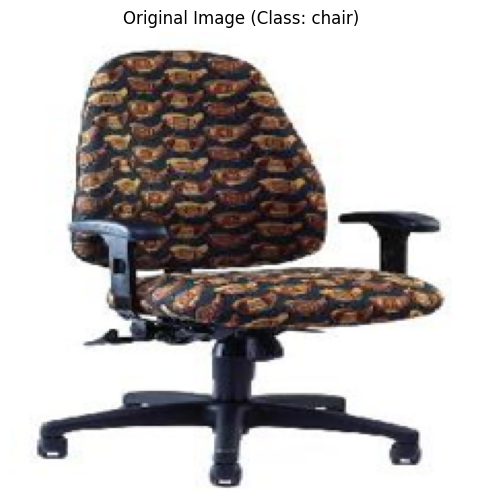

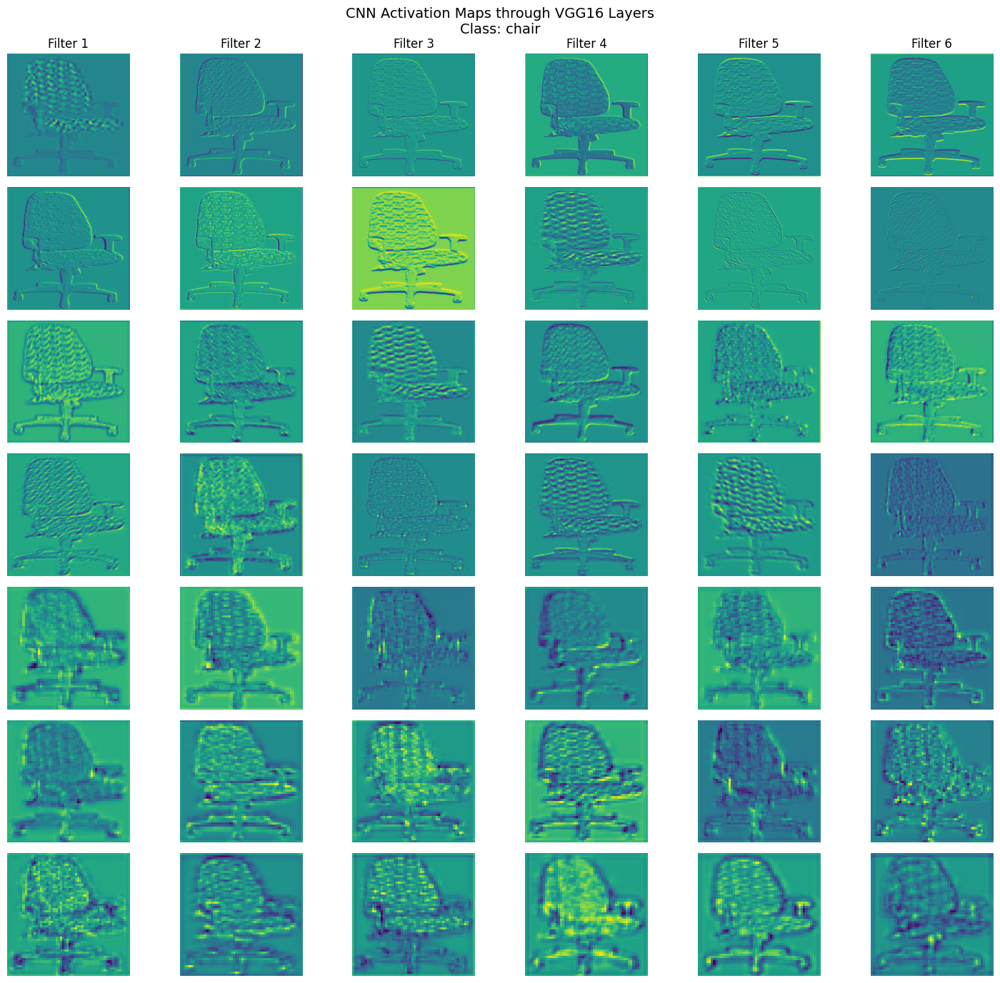

<Figure size 640x480 with 0 Axes>

In [18]:
# CNN Layer-wise Visualization (VGG16) with Fine-tuned Classifier

def visualize_finetuned_vgg16_layer_progression():
    """Visualize VGG16 layer activations using our fine-tuned classifier"""
    # Select a random image
    random_idx = random.randint(0, len(test_images) - 1)
    sample_img = test_images[random_idx]
    sample_label = test_labels[random_idx]
    
    print(f"Randomly selected image - Class: {categories[sample_label]}")
    
    # Prepare image
    image = Image.fromarray(sample_img)
    transform = Compose([
        Resize((224, 224)),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Load VGG16 model for feature extraction (base model)
    weights = VGG16_Weights.DEFAULT
    base_model = vgg16(weights=weights).features.to(device).eval()
    convert_relu_to_non_inplace(base_model)  # Convert in-place ReLU to non-in-place
    
    full_vgg = vgg16(weights=weights).to(device).eval()
    convert_relu_to_non_inplace(full_vgg)
    
    # Create the fine-tuned classifier
    # We'll use VGG19 features since they're already extracted
    input_size = vgg19_test_features.shape[1]  # Get feature dimension
    num_classes = len(categories)
    fc_classifier = FCClassifier(input_size, num_classes).to(device)
    
    # Train a classifier on VGG19 features
    print("Training a classifier for visualization purposes...")
    X_train = torch.FloatTensor(vgg19_train_features)
    y_train = torch.LongTensor(vgg19_train_labels)
    
    # Create dataset and dataloader
    class FeatureDataset(Dataset):
        def __init__(self, features, labels):
            self.features = features
            self.labels = labels
            
        def __len__(self):
            return len(self.features)
        
        def __getitem__(self, idx):
            return self.features[idx], self.labels[idx]
    
    train_dataset = FeatureDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    
    # Train model briefly
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(fc_classifier.parameters(), lr=0.001)
    
    fc_classifier.train()
    num_quick_epochs = 5  
    
    for epoch in range(num_quick_epochs):
        running_loss = 0.0
        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = fc_classifier(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        
        print(f"Quick training epoch {epoch+1}/{num_quick_epochs}, Loss: {running_loss/len(train_loader):.4f}")
    
    fc_classifier.eval()

    # First display the original image
    plt.figure(figsize=(6, 6))
    plt.imshow(sample_img)
    plt.title(f"Original Image (Class: {categories[sample_label]})")
    plt.axis('off')
    plt.show()

    # Save activations
    activations = []
    hooks = []
    def hook_fn(module, input, output):
        if isinstance(output, torch.Tensor):
            activations.append(output.detach().cpu())

    for layer in base_model:
        if isinstance(layer, nn.Conv2d):
            hooks.append(layer.register_forward_hook(hook_fn))

    with torch.no_grad():
        _ = base_model(input_tensor)

    for h in hooks:
        h.remove()

    # Visualize each layer's filters (6 per layer)
    layers_to_show = [0, 1, 2, 3, 4, 5, 6]  # Key conv layers from different blocks
    fig, axes = plt.subplots(len(layers_to_show), 6, figsize=(15, 14))
    for i, layer_idx in enumerate(layers_to_show):
        layer_act = activations[layer_idx][0]
        for j in range(6):
            axes[i, j].imshow(layer_act[j], cmap='viridis')
            axes[i, j].axis('off')
            if i == 0:
                axes[i, j].set_title(f"Filter {j+1}")
        axes[i, 0].set_ylabel(f"Layer {layer_idx}\nConv", rotation=0, labelpad=40, fontsize=10)

    plt.suptitle(f"CNN Activation Maps through VGG16 Layers\nClass: {categories[sample_label]}", fontsize=14)
    plt.tight_layout()
    plt.show()

    # Create VGG19 feature extractor for our image
    class VGG19FeatureExtractor(nn.Module):
        def __init__(self):
            super(VGG19FeatureExtractor, self).__init__()
            self.model = models.vgg19(weights=models.VGG19_Weights.DEFAULT)
            # Remove fully connected layers
            self.model = nn.Sequential(*list(self.model.children())[:-2])
            self.pool = nn.AdaptiveAvgPool2d((1, 1))
            
        def forward(self, x):
            x = self.model(x)
            x = self.pool(x).flatten(1)
            return x
    

    plt.tight_layout()
    plt.show()

# Execute the visualization
visualize_finetuned_vgg16_layer_progression()

In [19]:
def image_retrieval(query_idx, feature_name, test_features, test_labels, test_paths, top_k=5):
    # Get query features and label
    query_features = test_features[query_idx]
    query_label = test_labels[query_idx]
    query_path = test_paths[query_idx]
    
    # Calculate distances
    distances = np.linalg.norm(test_features - query_features, axis=1)
    
    # Get top-k nearest neighbors (excluding the query itself)
    indices = np.argsort(distances)
    # Skip the first one as it's the query itself
    top_indices = indices[1:top_k+1]
    
    retrieved_labels = test_labels[top_indices]
    retrieved_paths = [test_paths[i] for i in top_indices]
    
    # Calculate precision
    precision = np.mean(retrieved_labels == query_label)
    
    return {
        'query_path': query_path,
        'query_label': query_label,
        'retrieved_paths': retrieved_paths,
        'retrieved_labels': retrieved_labels,
        'precision': precision
    }

# Extract paths from test set
test_paths = []
for batch in test_loader:
    _, _, _, paths = batch
    test_paths.extend(paths)

# Sample random query indices
np.random.seed(42)
query_indices = np.random.choice(len(test_images), 10, replace=False)

# Perform image retrieval for each feature type
retrieval_results = {}

for feature_name, features in feature_extractors.items():
    _, _, test_feat, test_lab = features
    
    feature_precision = []
    for query_idx in query_indices:
        result = image_retrieval(query_idx, feature_name, test_feat, test_lab, test_paths, top_k=5)
        feature_precision.append(result['precision'])
        
        # Store first query result for visualization
        if query_idx == query_indices[0]:
            retrieval_results[feature_name] = result
    
    avg_precision = np.mean(feature_precision)
    print(f"{feature_name} Average Precision@5: {avg_precision:.4f}")

BoW Average Precision@5: 0.1800
Spatial Pyramid Average Precision@5: 0.2400
VGG13 Average Precision@5: 0.4800
VGG19 Average Precision@5: 0.6800


In [20]:
# Dictionary to store feature vectors for t-SNE visualization
feature_vectors = {}

for feature_name, features in feature_extractors.items():
    _, _, test_feat, test_lab = features
    
    # Use same query index used in retrieval_results
    query_path = retrieval_results[feature_name]['query_path']
    query_idx = test_paths.index(query_path)  # index of that image in the dataset
    
    query_feature = test_feat[query_idx]
    
    # Get indices of top-5 retrieved images
    retrieved_paths = retrieval_results[feature_name]['retrieved_paths']
    retrieved_indices = [test_paths.index(p) for p in retrieved_paths]
    retrieved_features = [test_feat[i] for i in retrieved_indices]
    
    # Save into feature_vectors dict
    feature_vectors[feature_name] = {
        'query': query_feature,
        'retrieved': retrieved_features
    }


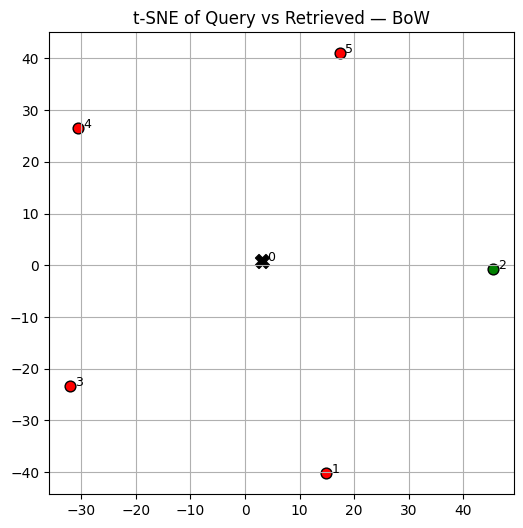

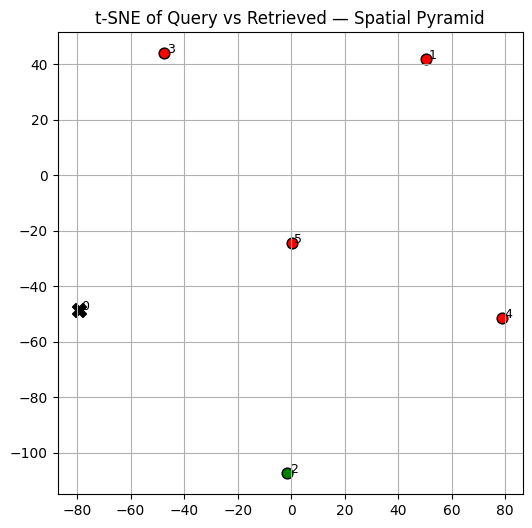

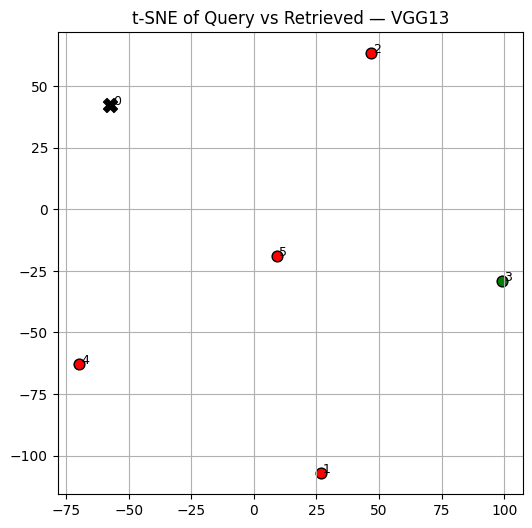

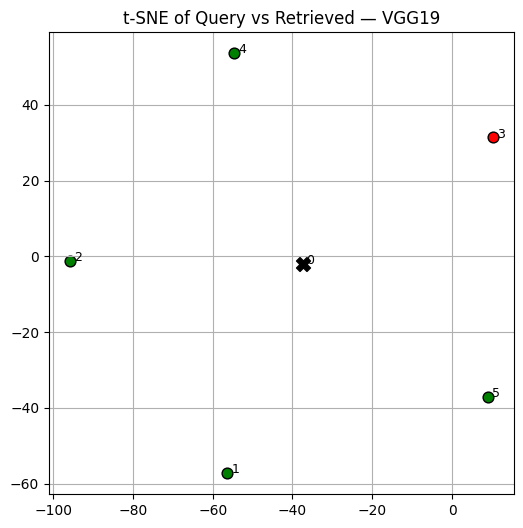

In [21]:


def visualize_tsne_of_retrievals(retrieval_results, feature_vectors):
    for feature_name in retrieval_results.keys():
        query_feat = feature_vectors[feature_name]['query']
        retrieved_feats = feature_vectors[feature_name]['retrieved']
        all_feats = np.vstack([query_feat] + retrieved_feats)

        tsne = TSNE(n_components=2, random_state=42, perplexity=5)
        proj = tsne.fit_transform(all_feats)

        query_label = retrieval_results[feature_name]['query_label']
        retrieved_labels = retrieval_results[feature_name]['retrieved_labels']

        colors = ['black'] + [
            'green' if lbl == query_label else 'red'
            for lbl in retrieved_labels
        ]
        markers = ['X'] + ['o'] * len(retrieved_feats)

        plt.figure(figsize=(6, 6))
        for i, (x, y) in enumerate(proj):
            plt.scatter(x, y, c=colors[i], marker=markers[i], s=100 if i == 0 else 60, edgecolor='k')
            plt.text(x + 1.0, y, f"{i}", fontsize=9)

        plt.savefig('retrieval_distance_2D.png', dpi=300, bbox_inches='tight')
        plt.title(f"t-SNE of Query vs Retrieved — {feature_name}")
        plt.grid(True)
        plt.show()


visualize_tsne_of_retrievals(retrieval_results, feature_vectors)


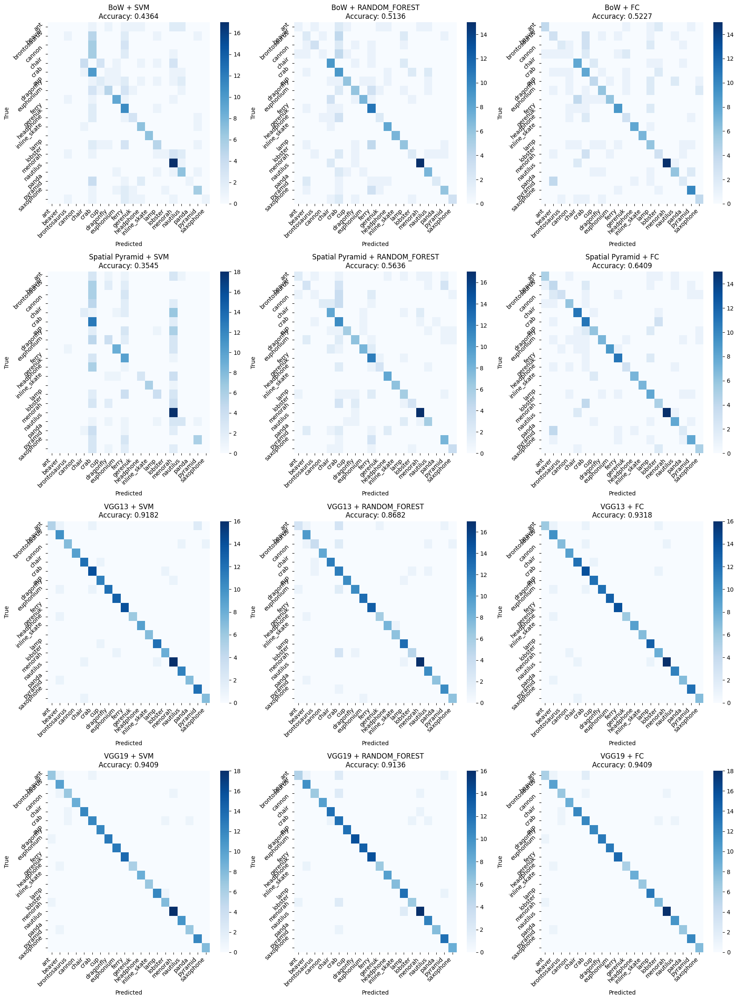

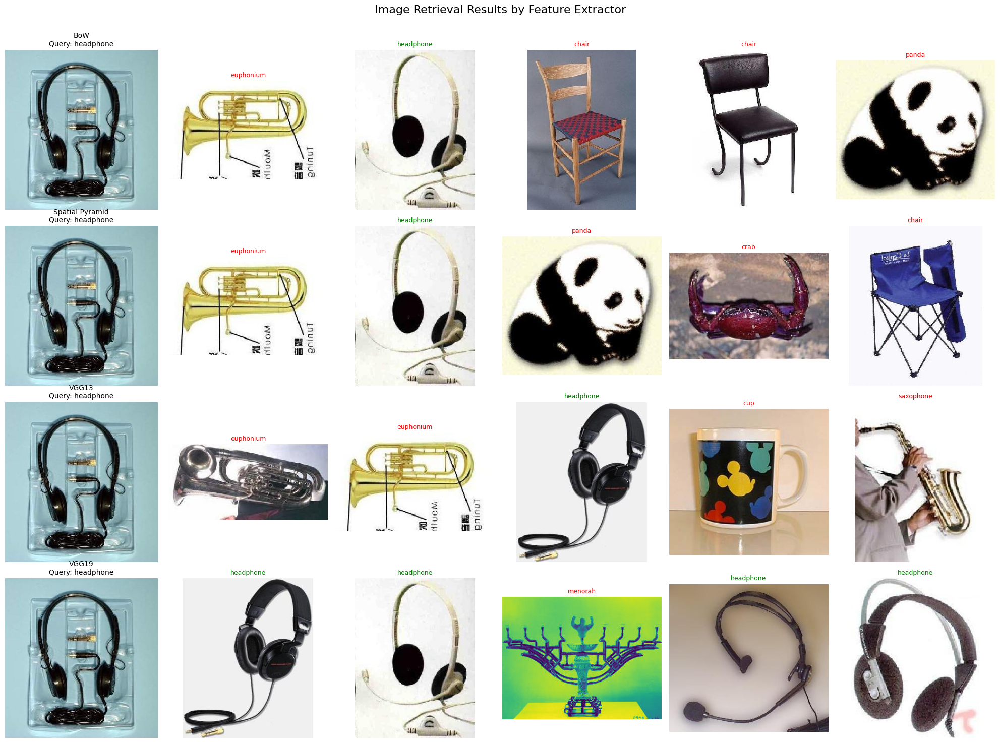

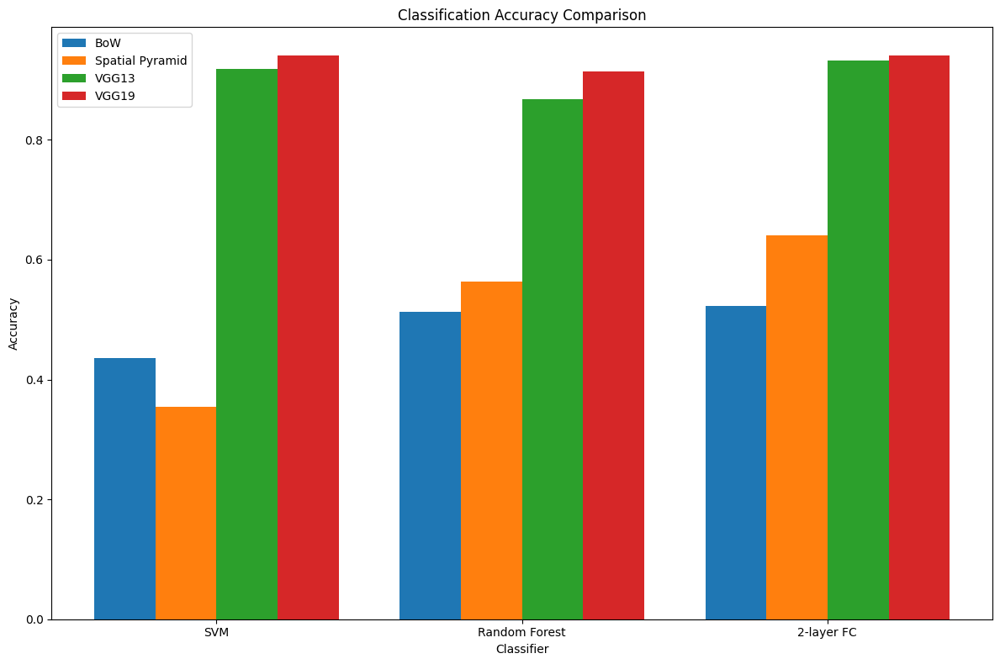

In [22]:
# Function to visualize confusion matrices
def plot_confusion_matrices(results, categories):
    # Create a figure with 12 subplots (4x3)
    fig, axes = plt.subplots(4, 3, figsize=(18, 24))
    
    # Flatten axes for easier iteration
    axes = axes.flatten()
    
    idx = 0
    for feature in ['BoW', 'Spatial Pyramid', 'VGG13', 'VGG19']:
        for classifier in ['svm', 'random_forest', 'fc']:
            key = f"{feature}_{classifier}"
            conf_matrix = results[key]['conf_matrix']
            accuracy = results[key]['accuracy']
            
            # Plot confusion matrix
            sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Blues', 
                        xticklabels=categories, yticklabels=categories, ax=axes[idx])
            axes[idx].set_title(f"{feature} + {classifier.upper()}\nAccuracy: {accuracy:.4f}")
            axes[idx].set_xlabel('Predicted')
            axes[idx].set_ylabel('True')
            
            # Rotate the ticklabels for better readability
            axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha='right')
            axes[idx].set_yticklabels(axes[idx].get_yticklabels(), rotation=45)
            
            idx += 1
    
    plt.tight_layout()
    plt.savefig('confusion_matrices.png', dpi=300, bbox_inches='tight')
    plt.show()

# Function to visualize image retrieval results
def visualize_retrieval_results(results):
    fig, axes = plt.subplots(4, 6, figsize=(20, 15))

    for i, (feature_name, result) in enumerate(results.items()):
        # Load query image
        query_img = Image.open(result['query_path'])

        # --- Set row title with feature name ---
        axes[i, 0].imshow(query_img)
        axes[i, 0].set_title(f"{feature_name}\nQuery: {categories[result['query_label']]}", fontsize=10)
        axes[i, 0].axis('off')

        # Display top-5 retrieved images
        for j, path in enumerate(result['retrieved_paths']):
            retrieved_img = Image.open(path)
            label = categories[result['retrieved_labels'][j]]

            axes[i, j+1].imshow(retrieved_img)
            color = 'green' if result['retrieved_labels'][j] == result['query_label'] else 'red'
            axes[i, j+1].set_title(label, color=color, fontsize=9)
            axes[i, j+1].axis('off')

    plt.suptitle(" Image Retrieval Results by Feature Extractor", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.savefig('retrieval_results.png', dpi=300, bbox_inches='tight')
    plt.show()


# Plot confusion matrices
plot_confusion_matrices(results, categories)

# Visualize retrieval results
visualize_retrieval_results(retrieval_results)

# Plot accuracy comparison
def plot_accuracy_comparison(results):
    # Extract accuracies
    accuracy_data = {
        'BoW': [],
        'Spatial Pyramid': [],
        'VGG13': [],
        'VGG19': []
    }
    
    classifiers = ['SVM', 'Random Forest', '2-layer FC']
    
    for feature in accuracy_data.keys():
        for i, classifier in enumerate(['svm', 'random_forest', 'fc']):
            key = f"{feature}_{classifier}"
            accuracy_data[feature].append(results[key]['accuracy'])
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(12, 8))
    
    x = np.arange(len(classifiers))
    width = 0.2
    
    # Plot bars for each feature
    for i, (feature, accuracies) in enumerate(accuracy_data.items()):
        ax.bar(x + i*width - 0.3, accuracies, width, label=feature)
    
    # Add labels and legend
    ax.set_xlabel('Classifier')
    ax.set_ylabel('Accuracy')
    ax.set_title('Classification Accuracy Comparison')
    ax.set_xticks(x)
    ax.set_xticklabels(classifiers)
    ax.legend()
    
    plt.tight_layout()
    plt.savefig('accuracy_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

plot_accuracy_comparison(results)

In [23]:

classification_summary = []

for feature in ['BoW', 'Spatial Pyramid', 'VGG13', 'VGG19']:
    for classifier in ['svm', 'random_forest', 'fc']:
        key = f"{feature}_{classifier}"
        acc = results[key]['accuracy']
        classification_summary.append({
            'Feature': feature,
            'Classifier': classifier.upper(),
            'Accuracy': acc
        })

# Define DataFrame
df_classification = pd.DataFrame(classification_summary)

# prepare for sorting
df_classification_sorted = df_classification.sort_values(by='Accuracy', ascending=False).reset_index(drop=True)

# totla mean accuracy
mean_accuracy = df_classification['Accuracy'].mean()

# best and worst rows
best_row = df_classification_sorted.iloc[0]
worst_row = df_classification_sorted.iloc[-1]

# group by feature
feature_grouped = df_classification.groupby('Feature')['Accuracy'].mean().reset_index()

print("전체 12개 분류 조합 정확도")
print(df_classification_sorted.to_string(index=False))

print(f"\n 전체 평균 정확도: {mean_accuracy:.4f}")

print("\n High Performance 조합")
print(best_row.to_frame().T.to_string(index=False))

print("\n Low Performance 조합")
print(worst_row.to_frame().T.to_string(index=False))

print("\n feature별 평균 정확도")
print(feature_grouped.to_string(index=False))


retrieval_summary = []

for feat, res in retrieval_results.items():
    correct = sum([label == res['query_label'] for label in res['retrieved_labels']])
    top5_accuracy = correct / len(res['retrieved_labels'])
    retrieval_summary.append({
        'Feature': feat,
        'Top-5 Accuracy': round(top5_accuracy, 4)
    })

df_retrieval = pd.DataFrame(retrieval_summary)

print("\n[Image Retrieval Top-5 Accuracy]")
print(df_retrieval.sort_values(by='Top-5 Accuracy', ascending=False).to_string(index=False))


전체 12개 분류 조합 정확도
        Feature    Classifier  Accuracy
          VGG19           SVM  0.940909
          VGG19            FC  0.940909
          VGG13            FC  0.931818
          VGG13           SVM  0.918182
          VGG19 RANDOM_FOREST  0.913636
          VGG13 RANDOM_FOREST  0.868182
Spatial Pyramid            FC  0.640909
Spatial Pyramid RANDOM_FOREST  0.563636
            BoW            FC  0.522727
            BoW RANDOM_FOREST  0.513636
            BoW           SVM  0.436364
Spatial Pyramid           SVM  0.354545

 전체 평균 정확도: 0.7121

 High Performance 조합
Feature Classifier  Accuracy
  VGG19        SVM  0.940909

 Low Performance 조합
        Feature Classifier  Accuracy
Spatial Pyramid        SVM  0.354545

 feature별 평균 정확도
        Feature  Accuracy
            BoW  0.490909
Spatial Pyramid  0.519697
          VGG13  0.906061
          VGG19  0.931818

[Image Retrieval Top-5 Accuracy]
        Feature  Top-5 Accuracy
          VGG19             0.8
            BoW       

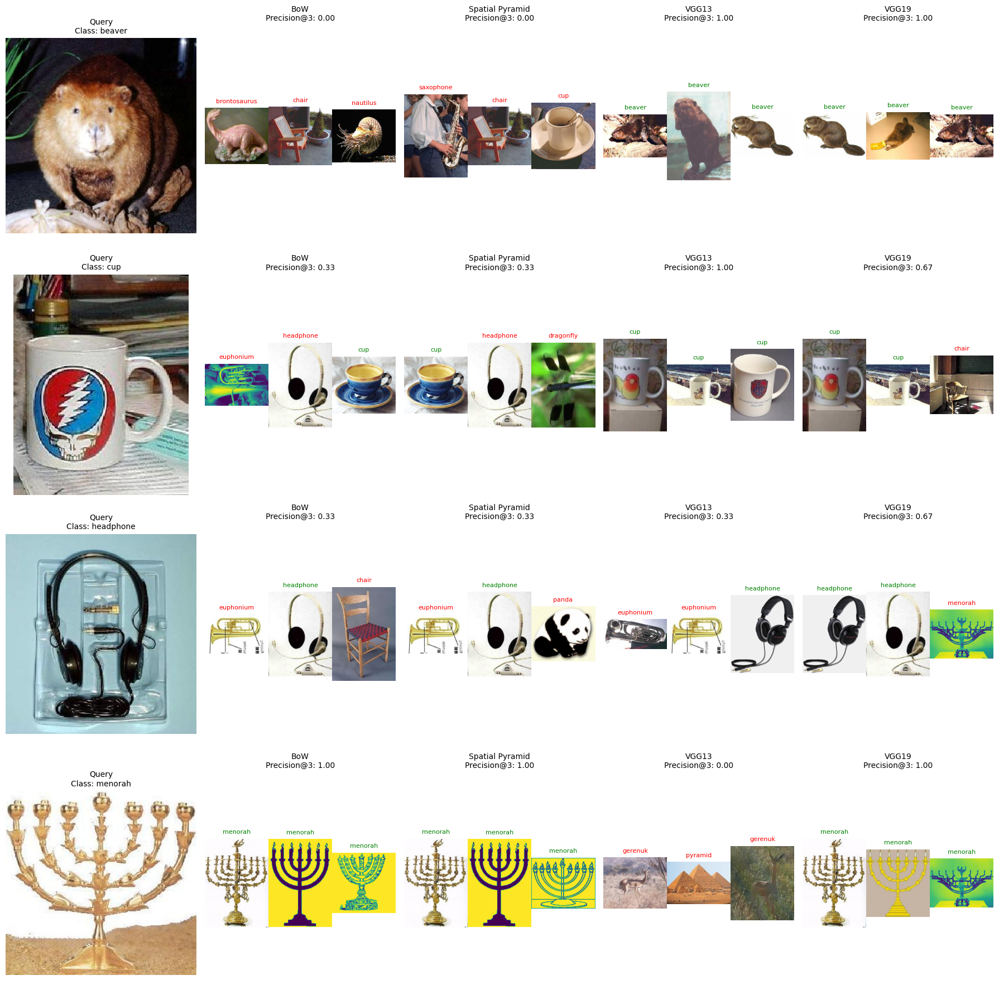

 Average Precision@3 (based on 4 query images)

- **BoW**: 0.4167

- **Spatial Pyramid**: 0.4167

- **VGG13**: 0.5833

- **VGG19**: 0.8333

In [24]:


# 1. random sampling
def select_random_queries(n=4):
    class_pool = list(set(test_labels))
    selected = []
    used_labels = set()
    attempts = 0

    while len(selected) < n and attempts < 1000:
        idx = random.choice(query_indices)
        label = test_labels[idx]
        if label not in used_labels:
            selected.append(idx)
            used_labels.add(label)
        attempts += 1
    return selected

feature_names = ['BoW', 'Spatial Pyramid', 'VGG13', 'VGG19']

query_indices_sampled = select_random_queries(n=4)

# 2. Retrieval 
precision_at_3_per_method = {method: [] for method in feature_names}

fig, axes = plt.subplots(len(query_indices_sampled), len(feature_names) + 1, 
                         figsize=(18, 4.5 * len(query_indices_sampled)))

for i, query_idx in enumerate(query_indices_sampled):
    query_img = Image.open(test_paths[query_idx])
    query_label = test_labels[query_idx]

    # Display query image
    axes[i, 0].imshow(query_img)
    axes[i, 0].set_title(f"Query\nClass: {categories[query_label]}", fontsize=10)
    axes[i, 0].axis('off')

    # handle each feature extractor
    for j, method in enumerate(feature_names):
        _, _, test_feat, test_lab = feature_extractors[method]

        query_feat = test_feat[query_idx]
        distances = np.linalg.norm(test_feat - query_feat, axis=1)
        sorted_indices = np.argsort(distances)[1:4]  # Query 제외 후 Top-3

        # Compute Precision@3
        retrieved_labels = test_lab[sorted_indices]
        correct = np.sum(retrieved_labels == query_label)
        precision = correct / 3
        precision_at_3_per_method[method].append(precision)

        for idx, img_idx in enumerate(sorted_indices):
            retrieved_img = Image.open(test_paths[img_idx])
            label = test_lab[img_idx]

            ax_sub = axes[i, j+1].inset_axes([idx/3, 0, 1/3, 1])
            ax_sub.imshow(retrieved_img)

            color = 'green' if label == query_label else 'red'
            ax_sub.set_title(f"{categories[label]}", fontsize=8, color=color)
            ax_sub.axis('off')

        axes[i, j+1].set_title(f"{method}\nPrecision@3: {precision:.2f}", fontsize=10)
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.savefig("image_retrieval_comparison_random4.png", dpi=300, bbox_inches='tight')
plt.show()

# 3. 평균 Precision@3 출력
display(Markdown(" Average Precision@3 (based on 4 query images)"))
for method in feature_names:
    p = np.mean(precision_at_3_per_method[method])
    display(Markdown(f"- **{method}**: {p:.4f}"))


In [25]:
# Print overall summary
print("\n\nOverall Summary and Analysis")
print("=" * 50)

# Calculate average accuracy for each feature extractor
feature_avg = {}
for feature in ['BoW', 'Spatial Pyramid', 'VGG13', 'VGG19']:
    accuracies = [results[f"{feature}_{clf}"]["accuracy"] for clf in ['svm', 'random_forest', 'fc']]
    feature_avg[feature] = np.mean(accuracies)
    
print("\nAverage Accuracy by Feature Extractor:")
for feature, avg in feature_avg.items():
    print(f"{feature:<15}: {avg:.4f}")

# Calculate average accuracy for each classifier
clf_avg = {}
for clf in ['svm', 'random_forest', 'fc']:
    accuracies = [results[f"{feature}_{clf}"]["accuracy"] for feature in ['BoW', 'Spatial Pyramid', 'VGG13', 'VGG19']]
    clf_avg[clf] = np.mean(accuracies)
    
print("\nAverage Accuracy by Classifier:")
for clf, avg in clf_avg.items():
    print(f"{clf:<15}: {avg:.4f}")

# Find best and worst combinations
accuracies = [(key, val['accuracy']) for key, val in results.items()]
best = max(accuracies, key=lambda x: x[1])
worst = min(accuracies, key=lambda x: x[1])

print(f"\nBest combination: {best[0]} with accuracy {best[1]:.4f}")
print(f"Worst combination: {worst[0]} with accuracy {worst[1]:.4f}")

# Print retrieval performance
print("\nImage Retrieval Performance (Precision@5):")
for feature_name in feature_extractors.keys():
    feature_precision = []
    for query_idx in query_indices:
        result = image_retrieval(query_idx, feature_name, 
                                feature_extractors[feature_name][2], 
                                feature_extractors[feature_name][3], 
                                test_paths, top_k=5)
        feature_precision.append(result['precision'])
    
    avg_precision = np.mean(feature_precision)
    print(f"{feature_name:<15}: {avg_precision:.4f}")



Overall Summary and Analysis

Average Accuracy by Feature Extractor:
BoW            : 0.4909
Spatial Pyramid: 0.5197
VGG13          : 0.9061
VGG19          : 0.9318

Average Accuracy by Classifier:
svm            : 0.6625
random_forest  : 0.7148
fc             : 0.7591

Best combination: VGG19_svm with accuracy 0.9409
Worst combination: Spatial Pyramid_svm with accuracy 0.3545

Image Retrieval Performance (Precision@5):
BoW            : 0.1800
Spatial Pyramid: 0.2400
VGG13          : 0.4800
VGG19          : 0.6800


In [26]:
feature_results = {
    'BoW': (bow_train_features, train_labels, bow_test_features, test_labels),
    'Spatial Pyramid': (sp_train_features, train_labels, sp_test_features, test_labels),
    'VGG13': (vgg13_train_features, vgg13_train_labels, vgg13_test_features, vgg13_test_labels),
    'VGG19': (vgg19_train_features, vgg19_train_labels, vgg19_test_features, vgg19_test_labels)
}

feature_names = ['BoW', 'Spatial Pyramid', 'VGG13', 'VGG19']
classifiers = ['SVM', 'Random Forest', '2-layer FC']

best_accs = {
    feature: max([results[f"{feature}_{clf}"]["accuracy"] for clf in ['svm', 'random_forest', 'fc']])
    for feature in feature_names
}

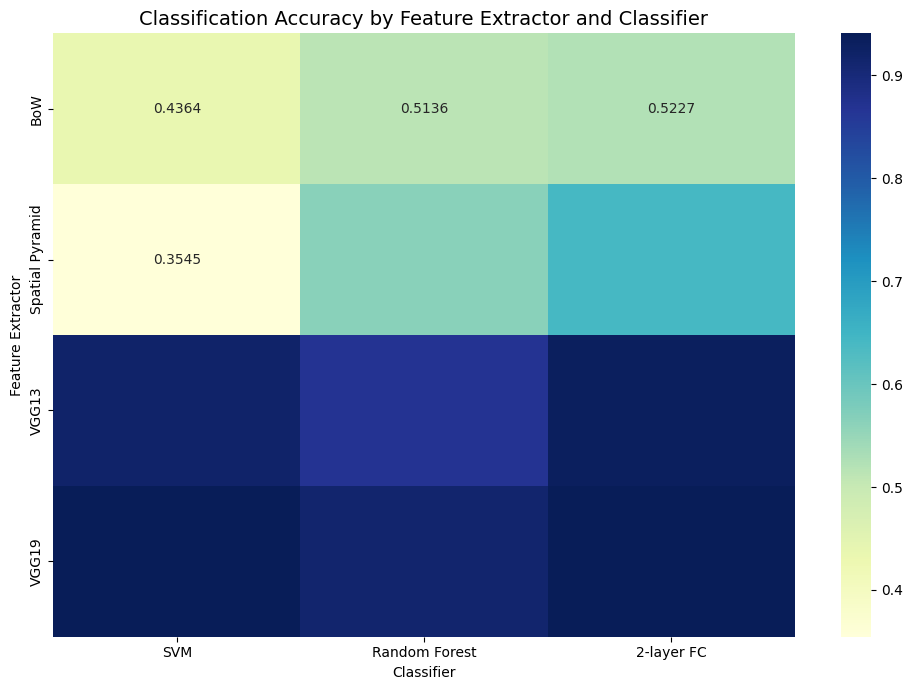

In [27]:
plt.figure(figsize=(10, 7))
accuracy_matrix = np.zeros((len(feature_names), len(classifiers)))

for i, feat in enumerate(feature_names):
    for j, clf in enumerate(['svm', 'random_forest', 'fc']):
        key = f"{feat}_{clf}"
        accuracy_matrix[i, j] = results[key]['accuracy']

sns.heatmap(accuracy_matrix, annot=True, fmt='.4f', cmap='YlGnBu',
            xticklabels=classifiers, yticklabels=feature_names)
plt.title('Classification Accuracy by Feature Extractor and Classifier', fontsize=14)
plt.xlabel('Classifier')
plt.ylabel('Feature Extractor')
plt.tight_layout()
plt.savefig('classification_accuracy_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

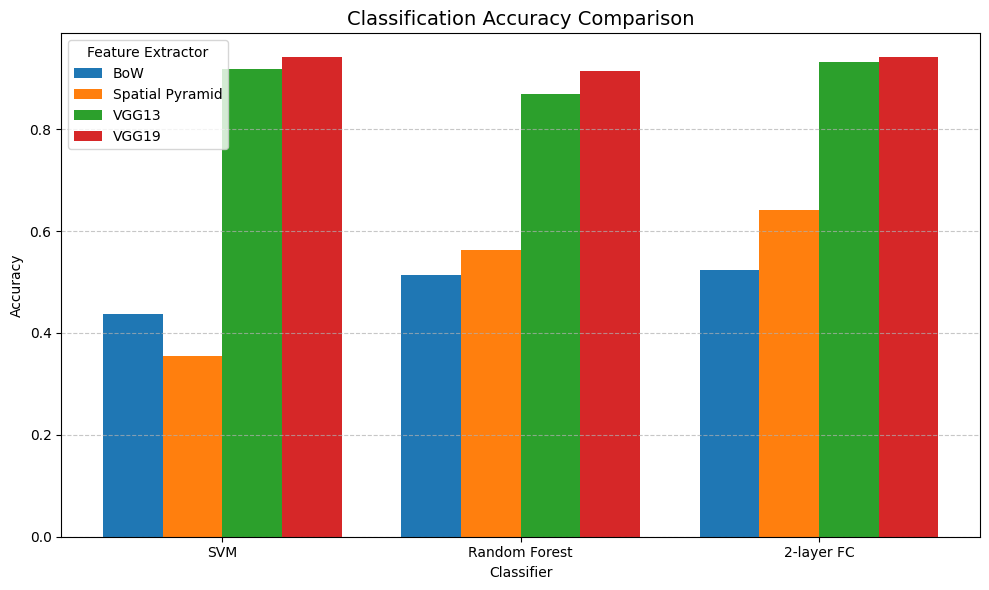

In [28]:
plt.figure(figsize=(10, 6))
x = np.arange(len(classifiers))
width = 0.2
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

for i, feature in enumerate(feature_names):
    accs = [results[f"{feature}_{clf}"]["accuracy"] for clf in ['svm', 'random_forest', 'fc']]
    plt.bar(x + (i - 1.5) * width, accs, width, label=feature, color=colors[i])

plt.xlabel('Classifier')
plt.ylabel('Accuracy')
plt.title('Classification Accuracy Comparison', fontsize=14)
plt.xticks(x, classifiers)
plt.legend(title='Feature Extractor')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('classification_accuracy_bars.png', dpi=300, bbox_inches='tight')
plt.show()

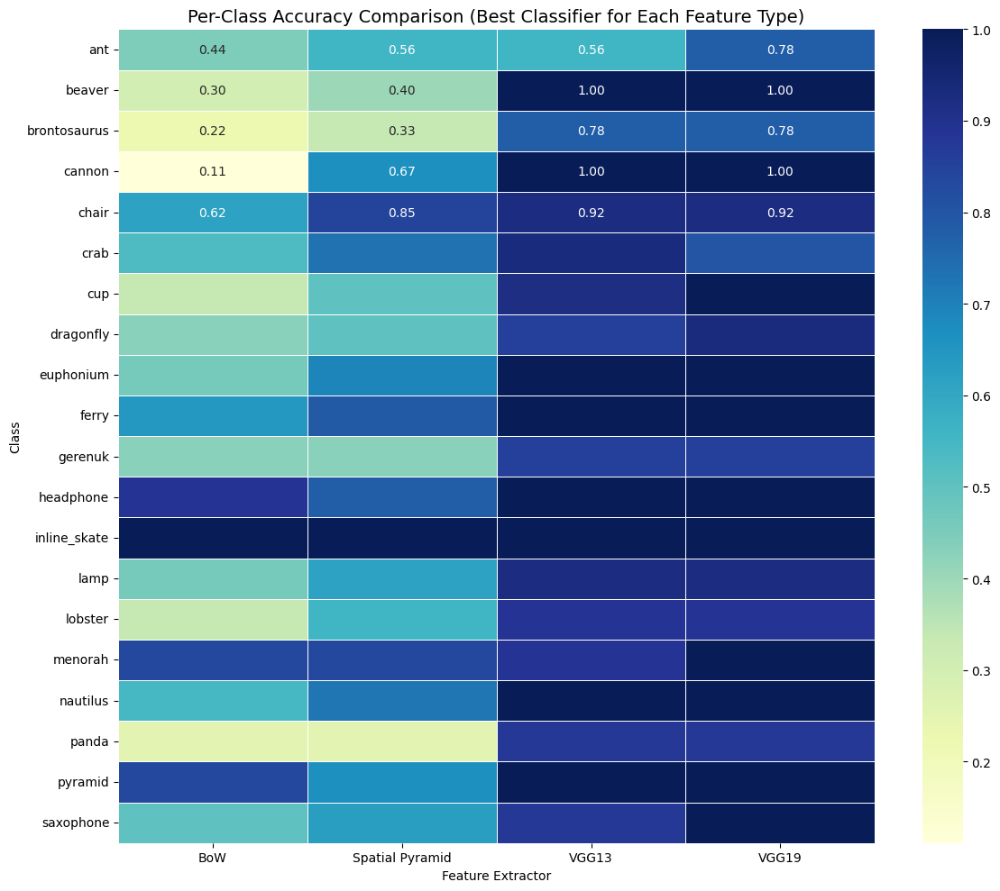

In [29]:
plt.figure(figsize=(12, 10))
class_accs = {}
best_methods = {
    'BoW': 'fc',
    'Spatial Pyramid': 'fc',
    'VGG13': 'svm',
    'VGG19': 'svm'
}

for feature, clf in best_methods.items():
    key = f"{feature}_{clf}"
    true_labels = results[key]['ground_truth']
    pred_labels = results[key]['predictions']

    class_accuracies = []
    for c in range(20): 
        mask = (true_labels == c)
        if np.sum(mask) > 0:
            acc = accuracy_score(true_labels[mask], pred_labels[mask])
        else:
            acc = 0
        class_accuracies.append(acc)

    class_accs[feature] = class_accuracies

df_class_accs = pd.DataFrame(class_accs)
df_class_accs.index = categories

sns.heatmap(df_class_accs, cmap='YlGnBu', annot=True, fmt='.2f', linewidths=.5)
plt.title('Per-Class Accuracy Comparison (Best Classifier for Each Feature Type)', fontsize=14)
plt.xlabel('Feature Extractor')
plt.ylabel('Class')
plt.tight_layout()
plt.savefig('per_class_accuracy_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

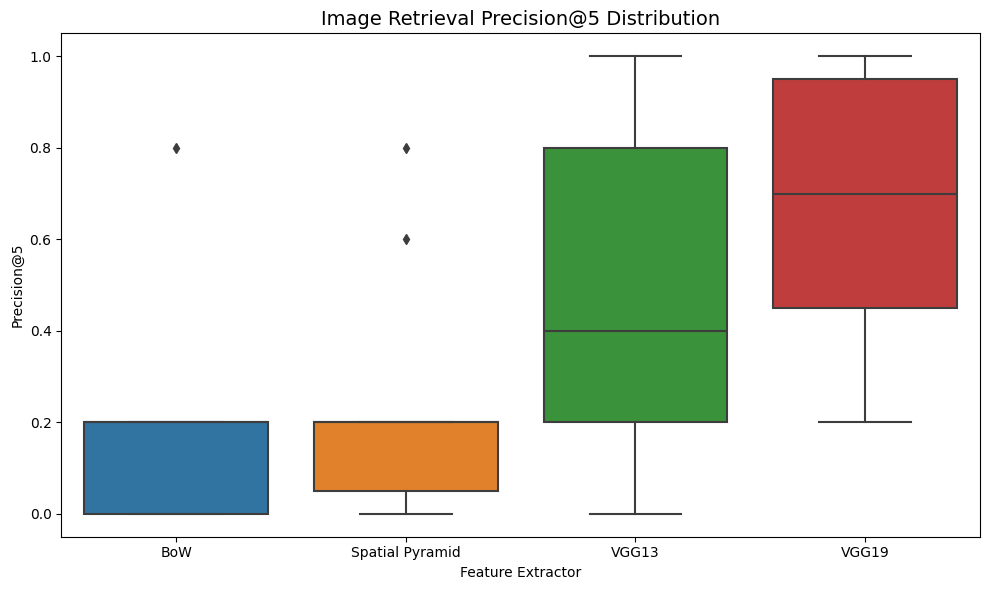

In [30]:
plt.figure(figsize=(10, 6))
precision_data = []

for feature_name in feature_names:
    test_X, test_y = feature_results[feature_name][2], feature_results[feature_name][3]
    precs = []
    for qidx in query_indices:
        result = image_retrieval(qidx, feature_name, test_X, test_y, test_paths, top_k=5)
        precs.append(result['precision'])
    precision_data.append(precs)

sns.boxplot(data=precision_data)
plt.xticks(range(len(feature_names)), feature_names)
plt.title('Image Retrieval Precision@5 Distribution', fontsize=14)
plt.xlabel('Feature Extractor')
plt.ylabel('Precision@5')
plt.tight_layout()
plt.savefig('retrieval_precision_boxplot.png', dpi=300, bbox_inches='tight')
plt.show()

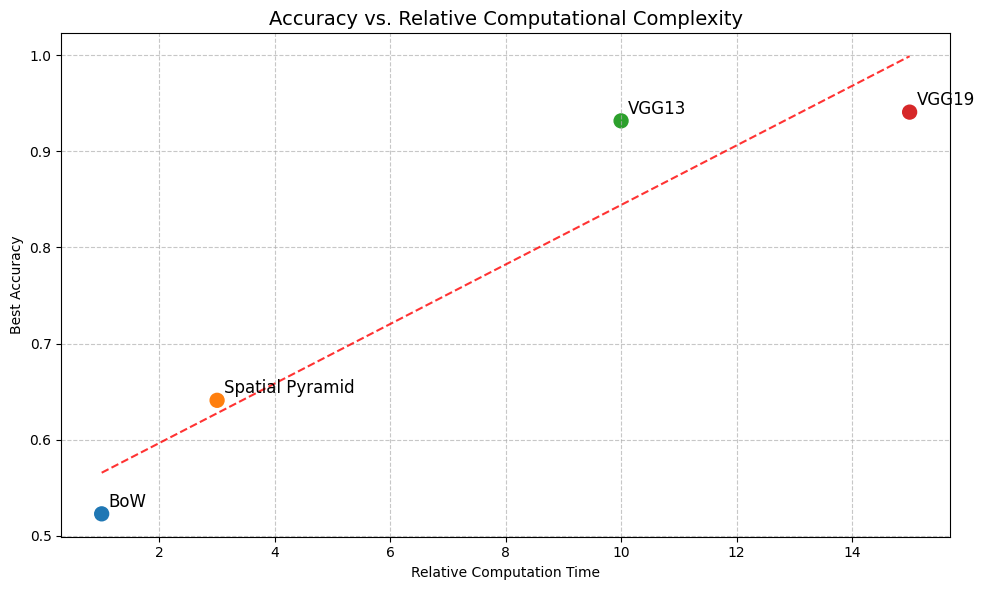

In [31]:
plt.figure(figsize=(10, 6))
compute_times = {
    'BoW': 1.0,
    'Spatial Pyramid': 3.0,
    'VGG13': 10.0,
    'VGG19': 15.0
}

times = [compute_times[f] for f in feature_names]
accs = [best_accs[f] for f in feature_names]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

plt.scatter(times, accs, s=100, c=colors)
for i, feature in enumerate(feature_names):
    plt.annotate(feature, (times[i], accs[i]), 
                 xytext=(5, 5), textcoords='offset points', fontsize=12)

plt.title('Accuracy vs. Relative Computational Complexity', fontsize=14)
plt.xlabel('Relative Computation Time')
plt.ylabel('Best Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)

# Add trend line
z = np.polyfit(times, accs, 1)
p = np.poly1d(z)
plt.plot(sorted(times), p(sorted(times)), "r--", alpha=0.8)

plt.tight_layout()
plt.savefig('accuracy_vs_computation.png', dpi=300, bbox_inches='tight')
plt.show()

# Expriments 

In [32]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import VotingClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

In [33]:

# SVM hyperparameter tuning
svm_params = {
    'C': [0.1, 1.0, 10.0, 100.0],
    'loss': ['hinge', 'squared_hinge'],
    'class_weight': [None, 'balanced']
}

# Random Forest hyperparameter tuning
rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'class_weight': [None, 'balanced', 'balanced_subsample']
}

# Perform grid search for feature/classifier combination
def optimize_classifier(X_train, y_train, classifier='svm'):
    if classifier == 'svm':
        model = LinearSVC(dual=False, max_iter=10000)
        param_grid = svm_params
    else:  # random forest
        model = RandomForestClassifier(random_state=42)
        param_grid = rf_params
    
    # Use stratified k-fold to handle class imbalance
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    grid = GridSearchCV(
        model, param_grid, cv=cv, 
        scoring='accuracy', verbose=1, n_jobs=-1
    )
    grid.fit(X_train, y_train)
    
    print(f"Best parameters: {grid.best_params_}")
    print(f"Best CV accuracy: {grid.best_score_:.4f}")
    
    return grid.best_estimator_

In [34]:

def enhance_features(train_features, test_features, method='standardize', pca_components=None):
    if method == 'standardize':
        # Standardize features to zero mean and unit variance
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train_features)
        test_scaled = scaler.transform(test_features)
        return train_scaled, test_scaled
        
    elif method == 'pca':
        # First standardize
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train_features)
        test_scaled = scaler.transform(test_features)
        
        # Then apply PCA
        if pca_components is None:
            # Choose components to retain 95% variance
            pca_components = 0.95
            
        pca = PCA(n_components=pca_components)
        train_pca = pca.fit_transform(train_scaled)
        test_pca = pca.transform(test_scaled)
        
        print(f"Reduced dimensions from {train_features.shape[1]} to {train_pca.shape[1]}")
        return train_pca, test_pca
        
    return train_features, test_features

In [35]:
def create_ensemble(feature_extractors, train_labels, classifier_type='svm'):
    classifiers = []
    
    for name, feature_set in feature_extractors.items():
        train_feat, _, _, _ = feature_set
        
        if classifier_type == 'svm':
            clf = LinearSVC(C=10.0, class_weight='balanced', dual=False, max_iter=10000)
            # Wrap SVC to support predict_proba for voting
            from sklearn.calibration import CalibratedClassifierCV
            clf = CalibratedClassifierCV(clf)
        else:  # random forest
            clf = RandomForestClassifier(n_estimators=200, max_depth=None, 
                                        class_weight='balanced', random_state=42)
        
        classifiers.append((name, clf))
    
    # Create and train voting ensemble
    ensemble = VotingClassifier(estimators=classifiers, voting='soft')
    
    # We need to manually prepare the training data
    all_train_features = []
    for name, feature_set in feature_extractors.items():
        train_feat, _, _, _ = feature_set
        all_train_features.append(train_feat)
    
    # Train the ensemble
    ensemble.fit(all_train_features, train_labels)
    
    return ensemble

In [36]:


def apply_resampling(X_train, y_train, method='smote'):
    # Check class distribution
    class_counts = Counter(y_train)
    print(f"Original class distribution: {class_counts}")
    
    if method == 'smote':
        # Apply SMOTE for oversampling minority classes
        smote = SMOTE(random_state=42)
        X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
    elif method == 'undersample':
        # Undersample majority classes
        undersampler = RandomUnderSampler(random_state=42)
        X_resampled, y_resampled = undersampler.fit_resample(X_train, y_train)
    elif method == 'hybrid':
        # First undersample extreme majority classes
        undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)
        X_temp, y_temp = undersampler.fit_resample(X_train, y_train)
        # Then oversample minority classes
        smote = SMOTE(random_state=42)
        X_resampled, y_resampled = smote.fit_resample(X_temp, y_temp)
    else:
        return X_train, y_train
    
    # Check new class distribution
    class_counts_new = Counter(y_resampled)
    print(f"Resampled class distribution: {class_counts_new}")
    
    return X_resampled, y_resampled

In [37]:
class ImprovedFCClassifier(nn.Module):
    def __init__(self, input_size, num_classes, hidden_sizes=[1024, 512]):
        super(ImprovedFCClassifier, self).__init__()
        
        # More flexible architecture with layer normalization
        layers = []
        prev_size = input_size
        
        for hidden_size in hidden_sizes:
            layers.append(nn.Linear(prev_size, hidden_size))
            layers.append(nn.LayerNorm(hidden_size))  # Layer normalization for stable training
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(0.5))
            prev_size = hidden_size
        
        # Output layer
        layers.append(nn.Linear(prev_size, num_classes))
        
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.model(x)

def train_fc_with_scheduler(train_features, train_labels, test_features, epochs=50):
    # Convert to tensors
    X_train = torch.FloatTensor(train_features)
    y_train = torch.LongTensor(train_labels)
    X_test = torch.FloatTensor(test_features)
    
    # Create dataset and dataloader with balanced sampler
    class_counts = np.bincount(train_labels)
    class_weights = 1. / torch.tensor(class_counts, dtype=torch.float)
    weights = class_weights[train_labels]
    sampler = torch.utils.data.WeightedRandomSampler(weights, len(weights))
    
    train_dataset = FeatureDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=64, sampler=sampler)
    
    # Create model with improved architecture
    input_size = train_features.shape[1]
    num_classes = len(np.unique(train_labels))
    model = ImprovedFCClassifier(input_size, num_classes).to(device)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-4)
    
    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=True
    )
    
    # Train model with early stopping
    model.train()
    best_loss = float('inf')
    patience_counter = 0
    patience = 10
    
    for epoch in range(epochs):
        running_loss = 0.0
        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        
        avg_loss = running_loss / len(train_loader)
        print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}")
        
        # Learning rate scheduling
        scheduler.step(avg_loss)
        
        # Early stopping
        if avg_loss < best_loss:
            best_loss = avg_loss
            patience_counter = 0
            # Save best model
            torch.save(model.state_dict(), 'best_fc_model.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break
    
    # Load best model
    model.load_state_dict(torch.load('best_fc_model.pth'))
    
    return model

In [38]:
# Example workflow to improve one feature-classifier combination
feature_name = 'VGG19'
train_feat, train_lab, test_feat, test_lab = feature_extractors[feature_name]

# 1. Feature enhancement
train_feat_enhanced, test_feat_enhanced = enhance_features(
    train_feat, test_feat, method='standardize'
)

# 2. Address class imbalance
train_feat_resampled, train_lab_resampled = apply_resampling(
    train_feat_enhanced, train_lab, method='hybrid'
)

# 3. Hyperparameter optimization for SVM
optimized_svm = optimize_classifier(
    train_feat_resampled, train_lab_resampled, classifier='svm'
)

# 4. Evaluate
predictions = optimized_svm.predict(test_feat_enhanced)
accuracy = accuracy_score(test_lab, predictions)
conf_matrix = confusion_matrix(test_lab, predictions)

print(f"Improved {feature_name} with SVM accuracy: {accuracy:.4f}")

Original class distribution: Counter({15: 69, 5: 58, 7: 54, 9: 53, 8: 51, 4: 49, 13: 48, 18: 45, 6: 45, 16: 44, 1: 36, 2: 34, 3: 34, 11: 33, 0: 33, 14: 32, 19: 32, 17: 30, 10: 27, 12: 24})
Resampled class distribution: Counter({0: 24, 1: 24, 2: 24, 3: 24, 4: 24, 5: 24, 6: 24, 7: 24, 8: 24, 9: 24, 10: 24, 11: 24, 12: 24, 13: 24, 14: 24, 15: 24, 16: 24, 17: 24, 18: 24, 19: 24})
Fitting 5 folds for each of 16 candidates, totalling 80 fits


/opt/homebrew/anaconda3/envs/computer_vision/lib/python3.11/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/anaconda3/envs/computer_vision/lib/python3.11/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/anaconda3/envs/computer_vision/lib/python3.11/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best parameters: {'C': 0.1, 'class_weight': None, 'loss': 'squared_hinge'}
Best CV accuracy: 0.9167
Improved VGG19 with SVM accuracy: 0.9000
